This notebook implements a pipeline for detecting parasites using the Segment Anything Model (SAM).

**Model Architecture**

We fine-tune SAM using Low-Rank Adaptation (LoRA), which injects small trainable matrices into the image encoder's attention layers while keeping the base weights frozen. The mask decoder is fully trainable. .

**Preprocessing and Tiling**

Full-resolution specimen images are preprocessed with CLAHE for contrast enhancement, then split into fixed 1024×1024 tiles. Only tiles containing annotated parasites are retained for training. Edge tiles are zero-padded to maintain consistent dimensions.

**Loss Function**

Training uses a weighted combination of Binary Cross-Entropy (BCE) and Dice loss:
- BCE provides pixel-wise supervision and stable gradients
- Dice loss directly optimizes the overlap metric and handles class imbalance

An optional positive class weight can be applied to BCE to prioritize recall over precision.

**Model Selection**

The best model is selected based on validation Dice score. Checkpoints are saved whenever validation Dice improves, with early stopping available if no improvement is seen for a specified number of epochs.

In [ ]:
import os
!git clone https://github.com/ia-project-parasite/IA-PROJECT-PARASITE-REPO.git
os.chdir('IA-PROJECT-PARASITE-REPO')

Cloning into 'IA-PROJECT-PARASITE-REPO'...
remote: Enumerating objects: 431, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 431 (delta 20), reused 77 (delta 16), pack-reused 345 (from 1)
Receiving objects: 100% (431/431), 730.61 MiB | 50.58 MiB/s, done.
Resolving deltas: 100% (139/139), done.
Updating files: 100% (206/206), done.


In [ ]:
!pip install -q torch torchvision
!pip install -q git+https://github.com/facebookresearch/segment-anything.git
!pip install -q opencv-python scikit-image pandas numpy matplotlib tqdm scikit-learn
!pip install -q loralib

  Preparing metadata (setup.py) ... done


In [ ]:
import os
import cv2
import numpy as np
import json
from pathlib import Path
from tqdm import tqdm
from PIL import Image
from scipy.ndimage import label as ndimage_label
from skimage.morphology import remove_small_holes, remove_small_objects
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict
import random
import shutil
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torch.nn as nn
from segment_anything import sam_model_registry
import loralib as lora  # LoRA library
import pandas as pd

## Dataset Preprocessing Functions


**Image Enhancement** `apply_clahe_and_brightness(bgr)`

Enhances image visibility using a two-stage approach:
1. CLAHE applied to the luminance channel in LAB color space (preserves color fidelity)
2. Fixed brightness boost via HSV value channel

**Specimen Segmentation**

`specimen_mask(bgr, use_hull=False)`

Isolates the specimen from the background using adaptive thresholding on HSV channels. The algorithm:
- Computes Otsu's threshold on the value channel, scaled to 70% for robustness
- Applies morphological opening/closing to clean up noise
- Retains only the largest connected component
- Optionally returns convex hull for simplified boundary

`roi_from_mask(img, mask, pad=10)`

Extracts a bounding box around the masked region with optional padding. Returns cropped image and mask.


In [ ]:
def apply_clahe_and_brightness(bgr):
    """
    Apply contrast-limited adaptive histogram equalization (CLAHE)
    followed by a brightness boost to enhance image visibility.

    Args:
        bgr: Input image in BGR color space

    Returns:
        Enhanced BGR image with improved contrast and brightness
    """
    # Convert to LAB color space to work on luminance channel
    img_lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(img_lab)

    # Apply CLAHE to luminance channel only (preserves color information)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    l2 = clahe.apply(l)

    # Merge enhanced luminance back with original color channels
    img_lab = cv2.merge((l2, a, b))
    bgr_corr = cv2.cvtColor(img_lab, cv2.COLOR_LAB2BGR)

    # Additional brightness boost via HSV value channel
    hsv = cv2.cvtColor(bgr_corr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v = cv2.add(v, 15)  # Add fixed brightness offset (saturates at 255)
    hsv = cv2.merge([h, s, v])
    bgr_corr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    return bgr_corr


def specimen_mask(bgr, use_hull=False):
    """
    Generate a binary mask isolating the specimen from background.
    Uses adaptive thresholding on value/saturation channels.

    Args:
        bgr: Input image in BGR color space
        use_hull: If True, return convex hull of specimen instead of actual boundary

    Returns:
        Boolean mask where True indicates specimen pixels
    """
    # Convert to HSV for better foreground/background separation
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(hsv)

    # Use Otsu's method to find optimal threshold, then scale down for robustness
    ret, _ = cv2.threshold(V, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    v_thr, s_thr = int(max(ret * 0.7, 25)), 15  # Minimum thresholds to avoid noise

    # Mask pixels with sufficient brightness and saturation (excludes dark background)
    m = ((V >= v_thr) & (S >= s_thr)).astype(np.uint8)

    # Morphological cleanup to remove noise and fill small gaps
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN, k)   # Remove small bright spots
    m = cv2.morphologyEx(m, cv2.MORPH_CLOSE, k)  # Fill small holes

    # Remove small disconnected regions and fill remaining holes
    m = remove_small_objects(m.astype(bool), min_size=3000)
    m = remove_small_holes(m, area_threshold=50000).astype(np.uint8)

    # Keep only the largest connected component (assumes single specimen)
    n, lab = cv2.connectedComponents(m)
    if n <= 1:
        return np.zeros(m.shape, bool)  # No foreground found
    cnts = np.bincount(lab.ravel())[1:]  # Skip background (label 0)
    keep = 1 + np.argmax(cnts)
    m = (lab == keep).astype(np.uint8)

    # Optionally compute convex hull for a simpler boundary
    if use_hull:
        contours, _ = cv2.findContours(m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            hull = cv2.convexHull(np.vstack(contours))
            m_hull = np.zeros_like(m)
            cv2.drawContours(m_hull, [hull], -1, 1, -1)
            m = m_hull

    return m.astype(bool)


def roi_from_mask(img, mask, pad=10):
    """
    Extract the bounding box region of interest from a binary mask.

    Args:
        img: Source image to crop
        mask: Binary mask indicating region of interest
        pad: Padding in pixels around the bounding box

    Returns:
        Tuple of (bbox_coords, cropped_image, cropped_mask) or (None, None, None) if empty
    """
    # Find all True pixels in the mask
    ys, xs = np.where(mask)
    if len(ys) == 0 or len(xs) == 0:
        return None, None, None

    # Compute bounding box with padding, clipped to image bounds
    y0, y1 = max(0, ys.min() - pad), min(img.shape[0], ys.max() + pad)
    x0, x1 = max(0, xs.min() - pad), min(img.shape[1], xs.max() + pad)

    return (y0, y1, x0, x1), img[y0:y1, x0:x1], mask[y0:y1, x0:x1]


def get_white_points_from_label(label_img):
    """
    Extract coordinates of white (bright) pixels from a label/annotation image.
    Used to parse point annotations marking parasite locations.

    Args:
        label_img: Annotation image (grayscale or BGR) with white markers

    Returns:
        List of (x, y) tuples for each white pixel
    """
    # Convert to grayscale if needed
    if len(label_img.shape) == 3:
        gray = cv2.cvtColor(label_img, cv2.COLOR_BGR2GRAY)
    else:
        gray = label_img

    # Threshold to isolate near-white pixels (annotation markers)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    ys, xs = np.where(thresh > 0)

    if len(xs) == 0:
        return []

    # Return as (x, y) coordinate pairs
    points = [(int(x), int(y)) for x, y in zip(xs, ys)]
    return points


def extract_centroids_from_points(points, img_shape):
    """
    Convert a dense point cloud (e.g., from brush annotations) into
    distinct object centroids via connected component analysis.

    Args:
        points: List of (x, y) coordinates forming annotation blobs
        img_shape: Shape of the original image (for creating binary mask)

    Returns:
        List of (x, y) centroid coordinates, one per connected region
    """
    if len(points) == 0:
        return []

    # Reconstruct binary mask from point list
    binary_mask = np.zeros(img_shape[:2], dtype=np.uint8)
    for x, y in points:
        if 0 <= y < img_shape[0] and 0 <= x < img_shape[1]:
            binary_mask[y, x] = 255

    # Label connected components (each annotation blob becomes one region)
    labeled_mask, num_parasites = ndimage_label(binary_mask)

    # Compute centroid for each labeled region
    centroids = []
    for region_id in range(1, num_parasites + 1):
        ys, xs = np.where(labeled_mask == region_id)
        if len(ys) > 0:
            centroid_x = int(xs.mean())
            centroid_y = int(ys.mean())
            centroids.append((centroid_x, centroid_y))

    return centroids

## Tiling Functions

After preprocessing, full-resolution images are split into fixed-size tiles for model training. This addresses memory constraints and provides spatial context appropriate for parasite detection.

- **Grid-based splitting**: Non-overlapping tiles at fixed resolution (default 1024×1024)
- **Edge handling**: Partial tiles are zero-padded to maintain consistent dimensions
- **Positive-only filtering**: Only tiles containing at least one parasite centroid are retained

Complete Processing Flow
```
Raw Image → CLAHE Enhancement → Specimen Segmentation → ROI Extraction → Centroid Detection → Tiling
```

Each tile includes:
- Cropped image and label patches
- Specimen mask
- Local point coordinates (relative to tile origin)
- Global bounding box for reconstruction
- Parasite count metadata

In [ ]:
def split_images_fixed_grid(original_img, label_img, mask_img, points, tile_size=1024, roi_bbox=None):
    """
    Split images into FIXED tile_size grid (NO OVERLAP).

    Returns list of tile dictionaries with metadata.
    """
    height, width = original_img.shape[:2]
    tiles = []
    tile_count = 0

    for y in range(0, height, tile_size):
        for x in range(0, width, tile_size):
            box = (x, y, min(x + tile_size, width), min(y + tile_size, height))
            x1, y1, x2, y2 = box

            # Crop tiles
            tile_original = original_img[y1:y2, x1:x2]
            tile_label = label_img[y1:y2, x1:x2]
            tile_mask = mask_img[y1:y2, x1:x2] if mask_img is not None else None

            # Pad to tile_size if needed (for edge tiles)
            actual_h, actual_w = tile_original.shape[:2]
            if actual_h < tile_size or actual_w < tile_size:
                padded_original = np.zeros((tile_size, tile_size, 3), dtype=np.uint8)
                padded_original[:actual_h, :actual_w] = tile_original

                if len(tile_label.shape) == 3:
                    padded_label = np.zeros((tile_size, tile_size, 3), dtype=np.uint8)
                else:
                    padded_label = np.zeros((tile_size, tile_size), dtype=np.uint8)
                padded_label[:actual_h, :actual_w] = tile_label

                if tile_mask is not None:
                    padded_mask = np.zeros((tile_size, tile_size), dtype=np.uint8)
                    padded_mask[:actual_h, :actual_w] = tile_mask
                else:
                    padded_mask = None

                tile_original = padded_original
                tile_label = padded_label
                tile_mask = padded_mask

            # Find points in this tile
            tile_points = []
            for px, py in points:
                if x1 <= px < x2 and y1 <= py < y2:
                    tile_points.append((px - x1, py - y1))

            # Only save tiles with parasites
            if len(tile_points) > 0:
                tiles.append({
                    'tile_original': tile_original,
                    'tile_label': tile_label,
                    'tile_mask': tile_mask,
                    'points_local': tile_points,
                    'tile_id': f"tile_{tile_count:04d}",
                    'global_bbox': (x1, y1, x2, y2),
                    'num_parasites': len(tile_points)
                })
                tile_count += 1

    return tiles


def process_image_complete(image_path, label_path, mask_path, image_id,
                          tile_size=1024, apply_clahe=True, extract_roi=True):
    """
    Complete preprocessing pipeline:
    1. Load images
    2. Apply CLAHE
    3. Extract ROI
    4. Convert labels to centroids
    5. Split into tiles
    """
    # Load images
    img = cv2.imread(image_path)
    label = cv2.imread(label_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE) if mask_path and os.path.exists(mask_path) else None

    if img is None or label is None:
        print(f"Warning: Could not read {image_id}")
        return []

    original_shape = img.shape

    # Apply preprocessing
    if apply_clahe:
        img = apply_clahe_and_brightness(img)

    # Extract ROI
    roi_bbox = None
    if extract_roi:
        specimen_m = specimen_mask(img, use_hull=False)
        bbox, img_roi, mask_roi = roi_from_mask(img, specimen_m, pad=10)

        if bbox is None:
            img_roi = img
            label_roi = label
            mask_roi_img = mask
        else:
            y0, y1, x0, x1 = bbox
            roi_bbox = bbox
            img_roi = img_roi.copy()
            img_roi[~mask_roi] = 0
            label_roi = label[y0:y1, x0:x1]
            mask_roi_img = mask[y0:y1, x0:x1] if mask is not None else None
    else:
        img_roi = img
        label_roi = label
        mask_roi_img = mask

    # Extract centroids
    points = get_white_points_from_label(label_roi)
    if len(points) == 0:
        return []

    centroids = extract_centroids_from_points(points, label_roi.shape)
    print(f"  [{image_id}] {len(points)} pixels → {len(centroids)} centroids")

    if len(centroids) == 0:
        return []

    # Split into tiles
    tiles = split_images_fixed_grid(img_roi, label_roi, mask_roi_img, centroids,
                                    tile_size=tile_size, roi_bbox=roi_bbox)

    # Add metadata
    for tile in tiles:
        tile['image_id'] = f"{image_id}_{tile['tile_id']}"
        tile['base_image_id'] = image_id
        tile['original_shape'] = original_shape
        tile['roi_bbox'] = roi_bbox

    return tiles

## Create Dataset

In [ ]:
museum_labels_dir = "Museum labels"
output_dir = "Combined_Dataset"
TILE_SIZE = 1024

os.makedirs(output_dir, exist_ok=True)

# Find all folders
folders = [f for f in os.listdir(museum_labels_dir)
           if os.path.isdir(os.path.join(museum_labels_dir, f))]

all_tiles = []
tiles_per_image = {}


for folder in tqdm(folders, desc="Processing images"):
    folder_path = os.path.join(museum_labels_dir, folder)

    # Look for files
    raw_img_path = os.path.join(folder_path, f"{folder}.JPG")
    label_mask_path = os.path.join(folder_path, f"{folder}_labels.png")
    mask_path = os.path.join(folder_path, f"{folder}_mask.png")

    # Check alternative extension
    if not os.path.exists(label_mask_path):
        label_mask_path = os.path.join(folder_path, f"{folder}_labels.JPG")

    if not os.path.exists(raw_img_path) or not os.path.exists(label_mask_path):
        continue

    # Process image
    tiles = process_image_complete(
        raw_img_path,
        label_mask_path,
        mask_path if os.path.exists(mask_path) else None,
        folder,
        tile_size=TILE_SIZE,
        apply_clahe=True,
        extract_roi=True
    )

    if len(tiles) == 0:
        continue

    # Create folder structure
    image_output_dir = os.path.join(output_dir, folder)
    tiles_dir = os.path.join(image_output_dir, "tiles")
    labels_dir = os.path.join(image_output_dir, "labels")
    masks_dir = os.path.join(image_output_dir, "masks")
    annotations_dir = os.path.join(image_output_dir, "annotations")

    os.makedirs(tiles_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(annotations_dir, exist_ok=True)

    # Save tiles
    for tile in tiles:
        tile_id = tile['tile_id']

        # Save images
        cv2.imwrite(os.path.join(tiles_dir, f"{tile_id}.png"), tile['tile_original'])
        cv2.imwrite(os.path.join(labels_dir, f"{tile_id}.png"), tile['tile_label'])

        if tile['tile_mask'] is not None:
            cv2.imwrite(os.path.join(masks_dir, f"{tile_id}.png"), tile['tile_mask'])

        # Save annotations
        x1_global, y1_global, x2_global, y2_global = tile['global_bbox']

        annotation_data = {
            'tile_id': tile['image_id'],
            'base_image_id': tile['base_image_id'],
            'num_parasites': tile['num_parasites'],
            'centroids_local': [[int(x), int(y)] for x, y in tile['points_local']],
            'centroids_global': [[int(x + x1_global), int(y + y1_global)]
                                for x, y in tile['points_local']],
            'bboxes_local': [[max(0, int(x - 20)), max(0, int(y - 20)),
                             min(TILE_SIZE, int(x + 20)), min(TILE_SIZE, int(y + 20))]
                            for x, y in tile['points_local']],
            'box_size': 40,
            'tile_bbox': [int(x1_global), int(y1_global), int(x2_global), int(y2_global)],
            'original_shape': [int(d) for d in tile['original_shape']],
            'roi_bbox': [int(d) for d in tile['roi_bbox']] if tile['roi_bbox'] else None
        }

        with open(os.path.join(annotations_dir, f"{tile_id}.json"), 'w') as f:
            json.dump(annotation_data, f, indent=2)

    all_tiles.extend(tiles)
    tiles_per_image[folder] = len(tiles)


print(f"Total images: {len(tiles_per_image)}")
print(f"Total tiles: {len(all_tiles)}")
print(f"Total parasites: {sum(t['num_parasites'] for t in all_tiles)}")
print(f"\nTiles per image: {tiles_per_image}")

Processing images:   0%|          | 0/44 [00:00<?, ?it/s]

  [B2025-00231b] 2965 pixels → 83 centroids


Processing images:   5%|▍         | 2/44 [00:16<05:21,  7.67s/it]

  [B2025-00139a] 12 pixels → 12 centroids


Processing images:   7%|▋         | 3/44 [00:21<04:13,  6.18s/it]

  [B2025-00084n] 28 pixels → 10 centroids
  [B2025-00158a] 5285 pixels → 146 centroids


Processing images:   9%|▉         | 4/44 [00:30<05:01,  7.54s/it]

  [B2025-00234a] 533 pixels → 15 centroids


Processing images:  11%|█▏        | 5/44 [00:34<04:04,  6.28s/it]

  [B2025-00139b] 9395 pixels → 127 centroids


Processing images:  14%|█▎        | 6/44 [00:43<04:34,  7.22s/it]

  [B2025-00153b] 10157 pixels → 281 centroids


Processing images:  16%|█▌        | 7/44 [00:58<05:54,  9.58s/it]

  [B2025-00176a] 1253 pixels → 35 centroids


Processing images:  18%|█▊        | 8/44 [01:02<04:46,  7.97s/it]

  [B2025-00146a] 11691 pixels → 329 centroids


Processing images:  20%|██        | 9/44 [01:19<06:18, 10.81s/it]

  [B2025-00143b] 700 pixels → 69 centroids


Processing images:  23%|██▎       | 10/44 [01:26<05:24,  9.54s/it]

  [B2025-00150a] 36095 pixels → 1007 centroids


Processing images:  25%|██▌       | 11/44 [02:06<10:26, 18.99s/it]

  [B2025-00150c] 772 pixels → 753 centroids


Processing images:  27%|██▋       | 12/44 [02:41<12:35, 23.61s/it]

  [B2025-00173b] 3338 pixels → 93 centroids


Processing images:  32%|███▏      | 14/44 [02:51<07:00, 14.00s/it]

  [B2025-00234b] 394 pixels → 11 centroids
  [B2025-00149d] 12216 pixels → 340 centroids


Processing images:  34%|███▍      | 15/44 [03:09<07:24, 15.33s/it]

  [B2025-00172b] 6302 pixels → 177 centroids


Processing images:  36%|███▋      | 16/44 [03:17<06:04, 13.03s/it]

  [B2025-00141c] 21164 pixels → 594 centroids


Processing images:  39%|███▊      | 17/44 [03:42<07:29, 16.64s/it]

  [B2025-00153a] 12130 pixels → 338 centroids


Processing images:  41%|████      | 18/44 [04:00<07:22, 17.03s/it]

  [B2025-00173a] 5148 pixels → 145 centroids


Processing images:  43%|████▎     | 19/44 [04:09<06:01, 14.46s/it]

  [B2025-00171a] 14360 pixels → 401 centroids


Processing images:  45%|████▌     | 20/44 [04:24<05:56, 14.84s/it]

  [B2025-00138b] 13 pixels → 13 centroids


Processing images:  48%|████▊     | 21/44 [04:28<04:25, 11.53s/it]

  [B2025-00146c] 10460 pixels → 291 centroids


Processing images:  50%|█████     | 22/44 [04:43<04:36, 12.57s/it]

  [B2025-00182c] 1192 pixels → 33 centroids


Processing images:  52%|█████▏    | 23/44 [04:48<03:33, 10.17s/it]

  [B2025-00136b] 731 pixels → 321 centroids


Processing images:  55%|█████▍    | 24/44 [05:05<04:06, 12.31s/it]

  [B2025-00130c] 4074 pixels → 192 centroids


Processing images:  57%|█████▋    | 25/44 [05:15<03:39, 11.55s/it]

  [B2025-00206b] 1343 pixels → 37 centroids


Processing images:  59%|█████▉    | 26/44 [05:19<02:50,  9.50s/it]

  [B2025-00141a] 8554 pixels → 240 centroids


Processing images:  61%|██████▏   | 27/44 [05:34<03:04, 10.86s/it]

  [B2025-00155e] 19661 pixels → 548 centroids


Processing images:  66%|██████▌   | 29/44 [06:04<03:00, 12.00s/it]

  [B2025-00142a] 6 pixels → 6 centroids
  [B2025-00140b] 23074 pixels → 395 centroids


Processing images:  68%|██████▊   | 30/44 [06:20<03:07, 13.42s/it]

  [B2025-00137d] 12884 pixels → 66 centroids


Processing images:  70%|███████   | 31/44 [06:29<02:33, 11.82s/it]

  [B2025-00137b] 157 pixels → 157 centroids


Processing images:  73%|███████▎  | 32/44 [06:41<02:25, 12.10s/it]

  [B2025-00156a] 7819 pixels → 218 centroids


Processing images:  75%|███████▌  | 33/44 [06:54<02:13, 12.16s/it]

  [B2025-00158b] 4566 pixels → 126 centroids


Processing images:  77%|███████▋  | 34/44 [07:02<01:49, 10.99s/it]

  [B2025-00144b] 20791 pixels → 579 centroids


Processing images:  80%|███████▉  | 35/44 [07:30<02:25, 16.17s/it]

  [B2025-00086a] 323 pixels → 322 centroids


Processing images:  84%|████████▍ | 37/44 [07:48<01:24, 12.01s/it]

  [B2025-00139a-1] 38 pixels → 38 centroids
  [B2025-00130b] 190 pixels → 188 centroids


Processing images:  86%|████████▋ | 38/44 [07:58<01:09, 11.52s/it]

  [B2025-00176b] 1796 pixels → 49 centroids


Processing images:  89%|████████▊ | 39/44 [08:05<00:49,  9.96s/it]

  [B2025-00085k] 138 pixels → 138 centroids


Processing images:  91%|█████████ | 40/44 [08:12<00:36,  9.18s/it]

  [B2025-00085.2] 263 pixels → 263 centroids


Processing images:  93%|█████████▎| 41/44 [08:25<00:31, 10.37s/it]

  [B2025-00172a] 6827 pixels → 190 centroids


Processing images:  95%|█████████▌| 42/44 [08:35<00:20, 10.32s/it]

  [B2025-00130e] 170 pixels → 170 centroids


Processing images:  98%|█████████▊| 43/44 [08:43<00:09,  9.65s/it]

  [B2025-00085e] 568 pixels → 157 centroids


Processing images: 100%|██████████| 44/44 [08:57<00:00, 12.20s/it]

Total images: 44
Total tiles: 312
Total parasites: 9703

Tiles per image: {'B2025-00231b': 6, 'B2025-00139a': 4, 'B2025-00084n': 3, 'B2025-00158a': 10, 'B2025-00234a': 4, 'B2025-00139b': 8, 'B2025-00153b': 7, 'B2025-00176a': 6, 'B2025-00146a': 9, 'B2025-00143b': 7, 'B2025-00150a': 8, 'B2025-00150c': 10, 'B2025-00173b': 5, 'B2025-00234b': 3, 'B2025-00149d': 8, 'B2025-00172b': 7, 'B2025-00141c': 7, 'B2025-00153a': 10, 'B2025-00173a': 8, 'B2025-00171a': 6, 'B2025-00138b': 5, 'B2025-00146c': 8, 'B2025-00182c': 6, 'B2025-00136b': 7, 'B2025-00130c': 9, 'B2025-00206b': 6, 'B2025-00141a': 6, 'B2025-00155e': 8, 'B2025-00142a': 1, 'B2025-00140b': 7, 'B2025-00137d': 8, 'B2025-00137b': 10, 'B2025-00156a': 7, 'B2025-00158b': 6, 'B2025-00144b': 9, 'B2025-00086a': 8, 'B2025-00139a-1': 2, 'B2025-00130b': 8, 'B2025-00176b': 6, 'B2025-00085k': 10, 'B2025-00085.2': 9, 'B2025-00172a': 9, 'B2025-00130e': 7, 'B2025-00085e': 14}


## Loading from Google Collab

The tiled dataset was generated once and saved to Google Drive. We load it here to avoid reprocessing.

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')

output_dir = '/content/drive/MyDrive/Parasite_Dataset_Processed'

Mounted at /content/drive


## Split Dataset (Train/Val/Test)

In [ ]:
splits = {
    'train': [
        'B2025-00085e', 'B2025-00085k',
        'B2025-00150a', 'B2025-00150c',
        'B2025-00130b', 'B2025-00130c',
        'B2025-00158a', 'B2025-00158b',
        'B2025-00172a', 'B2025-00172b',
        'B2025-00173a', 'B2025-00173b',
        'B2025-00141a', 'B2025-00141c',
        'B2025-00176a', 'B2025-00176b',
        'B2025-00153a',
        'B2025-00146c', 'B2025-00137b',
        'B2025-00149d', 'B2025-00146a',
        'B2025-00144b', 'B2025-00156a',
        'B2025-00155e', 'B2025-00139b',
        'B2025-00137d',
        'B2025-00086a', 'B2025-00140b'
    ],

    'val': [
        'B2025-00234a', 'B2025-00084n',
        'B2025-00139a', 'B2025-00139a-1',
        'B2025-00138b', 'B2025-00171a',
        'B2025-00182c'
    ],

    'test': [
        'B2025-00231b', 'B2025-00143b',
        'B2025-00206b', 'B2025-00136b',
        'B2025-00085.2', 'B2025-00142a'
    ]
}

print(f"Train: {len(splits['train'])} images")
print(f"Val:   {len(splits['val'])} images")
print(f"Test:  {len(splits['test'])} images")
print(f"\nTrain images: {splits['train']}")
print(f"Val images:   {splits['val']}")
print(f"Test images:  {splits['test']}")

Train: 28 images
Val:   7 images
Test:  6 images

Train images: ['B2025-00085e', 'B2025-00085k', 'B2025-00150a', 'B2025-00150c', 'B2025-00130b', 'B2025-00130c', 'B2025-00158a', 'B2025-00158b', 'B2025-00172a', 'B2025-00172b', 'B2025-00173a', 'B2025-00173b', 'B2025-00141a', 'B2025-00141c', 'B2025-00176a', 'B2025-00176b', 'B2025-00153a', 'B2025-00146c', 'B2025-00137b', 'B2025-00149d', 'B2025-00146a', 'B2025-00144b', 'B2025-00156a', 'B2025-00155e', 'B2025-00139b', 'B2025-00137d', 'B2025-00086a', 'B2025-00140b']
Val images:   ['B2025-00234a', 'B2025-00084n', 'B2025-00139a', 'B2025-00139a-1', 'B2025-00138b', 'B2025-00171a', 'B2025-00182c']
Test images:  ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']


## Dataset Class for PyTorch

The `SAMDatasetNoPrompt` class loads tile-mask pairs. It applies optional geometric augmentations (flips, 90° rotations) and returns normalized tensors.

In [ ]:
class SAMDatasetNoPrompt(Dataset):
    """Dataset for SAM fine-tuning"""

    def __init__(self, image_ids, output_dir, augment=False):
        self.samples = []
        self.augment = augment

        for img_id in image_ids:
            tiles_dir = os.path.join(output_dir, img_id, "tiles")
            masks_dir = os.path.join(output_dir, img_id, "masks")
            annotations_dir = os.path.join(output_dir, img_id, "annotations")

            if not os.path.exists(tiles_dir):
                continue

            tile_files = [f for f in os.listdir(tiles_dir) if f.endswith('.png')]

            for tile_file in tile_files:
                tile_id = tile_file.replace('.png', '')
                tile_path = os.path.join(tiles_dir, tile_file)
                mask_path = os.path.join(masks_dir, f"{tile_id}.png")
                anno_path = os.path.join(annotations_dir, f"{tile_id}.json")

                if os.path.exists(mask_path) and os.path.exists(anno_path):
                    with open(anno_path, 'r') as f:
                        anno = json.load(f)

                    self.samples.append({
                        'tile_path': tile_path,
                        'mask_path': mask_path,
                        'tile_id': tile_id,
                        'base_image_id': img_id,
                        'num_parasites': anno['num_parasites']
                    })

        print(f"Loaded {len(self.samples)} samples (augment={augment})")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]

        # Load image and mask
        image = cv2.imread(sample['tile_path'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(sample['mask_path'], cv2.IMREAD_GRAYSCALE)
        binary_mask = (mask > 127).astype(np.float32)

        if self.augment:
            if random.random() > 0.5:
                image = cv2.flip(image, 1).copy()
                binary_mask = cv2.flip(binary_mask, 1).copy()
            if random.random() > 0.5:
                image = cv2.flip(image, 0).copy()
                binary_mask = cv2.flip(binary_mask, 0).copy()
            if random.random() > 0.5:
                k = random.choice([1, 2, 3])
                image = np.rot90(image, k).copy()
                binary_mask = np.rot90(binary_mask, k).copy()

        # Convert to tensors
        image_tensor = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        mask_tensor = torch.from_numpy(binary_mask).unsqueeze(0).float()

        return {
            'image': image_tensor,
            'mask': mask_tensor,
            'tile_id': sample['tile_id'],
            'num_parasites': sample['num_parasites']
        }

## SAM Fine-Tuner with LoRA



The `SAMFineTuner_LoRA` class implements parameter-efficient fine-tuning of SAM using Low-Rank Adaptation. It injects trainable LoRA adapters into the image encoder's attention layers while keeping the base weights frozen, and fully trains the mask decoder. Loss is computed as a weighted combination of BCE and Dice.

In [ ]:
class SAMFineTuner_LoRA:
    """
    Fine-tuner for Segment Anything Model (SAM) using Low-Rank Adaptation (LoRA).

    LoRA enables efficient fine-tuning by injecting trainable low-rank matrices
    into the attention layers while keeping the base model frozen. This reduces
    memory requirements and training time while preserving pretrained knowledge.

    Training strategy:
        - Image encoder: Frozen except for LoRA adapters on QKV projections
        - Prompt encoder: Fully frozen (no prompts used)
        - Mask decoder: Fully trainable
    """

    def __init__(self, sam_model, device, learning_rate=1e-4, lora_rank=8,
                optimizer_type='adam', weight_decay=1e-4,
                bce_weight=1.0, dice_weight=1.0, grad_clip=None,
                pos_weight=1.0):
        """
        Initialize SAM fine-tuner with LoRA configuration.

        Args:
            sam_model: Pretrained SAM model instance
            device: Target device ('cuda' or 'cpu')
            learning_rate: Learning rate for optimizer (default: 1e-4)
            lora_rank: Rank of LoRA decomposition matrices (default: 8)
            optimizer_type: Optimizer choice - 'adam', 'adamw', or 'sgd'
            weight_decay: L2 regularization strength (default: 1e-4)
            bce_weight: Weight for binary cross-entropy loss (default: 1.0)
            dice_weight: Weight for Dice loss (default: 1.0)
            grad_clip: Maximum gradient norm for clipping (default: None)
            pos_weight: Weight for positive class in BCE loss (default: 1.0)
                        Values > 1.0 penalize false negatives more heavily,
                        which can improve recall for sparse targets
        """
        self.sam = sam_model
        self.device = device
        self.lora_rank = lora_rank
        self.grad_clip = grad_clip
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.pos_weight = pos_weight

        # Inject LoRA adapters into image encoder attention layers
        self._apply_lora_to_image_encoder()

        # Freeze base image encoder, keep only LoRA parameters trainable
        for name, param in self.sam.image_encoder.named_parameters():
            if 'lora' not in name:
                param.requires_grad = False
            else:
                param.requires_grad = True

        # Freeze prompt encoder entirely (not used in prompt-free mode)
        for param in self.sam.prompt_encoder.parameters():
            param.requires_grad = False

        # Train mask decoder fully
        for param in self.sam.mask_decoder.parameters():
            param.requires_grad = True

        # Collect trainable parameters: LoRA adapters + mask decoder
        lora_params = [p for n, p in self.sam.image_encoder.named_parameters()
                      if 'lora' in n and p.requires_grad]
        decoder_params = list(self.sam.mask_decoder.parameters())
        trainable_params = lora_params + decoder_params

        # Initialize optimizer based on specified type
        if optimizer_type.lower() == 'adam':
            self.optimizer = torch.optim.Adam(
                trainable_params,
                lr=learning_rate
            )
        elif optimizer_type.lower() == 'adamw':
            self.optimizer = torch.optim.AdamW(
                trainable_params,
                lr=learning_rate,
                weight_decay=weight_decay
            )
        elif optimizer_type.lower() == 'sgd':
            self.optimizer = torch.optim.SGD(
                trainable_params,
                lr=learning_rate,
                momentum=0.9,
                weight_decay=weight_decay
            )
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_type}")

        # Configure BCE loss with optional positive class weighting
        # Higher pos_weight helps with class imbalance (sparse parasites)
        if pos_weight > 1.0:
            self.bce_loss = nn.BCEWithLogitsLoss(
                pos_weight=torch.tensor([pos_weight]).to(device)
            )
            print(f"Using pos_weight={pos_weight} (prioritizing detection recall)")
        else:
            self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_loss = self.dice_loss_fn

        # Log parameter counts for verification
        total_params = sum(p.numel() for p in self.sam.parameters())
        trainable_params_count = sum(p.numel() for p in self.sam.parameters() if p.requires_grad)
        lora_params_count = sum(p.numel() for p in lora_params)

        print(f"Trainable parameters:    {trainable_params_count:,} ({100*trainable_params_count/total_params:.2f}%)")
        print(f"  - LoRA parameters:     {lora_params_count:,}")
        print(f"  - Decoder parameters:  {trainable_params_count - lora_params_count:,}")


    def _apply_lora_to_image_encoder(self):
        """
        Apply LoRA adapters to QKV projection layers in each transformer block.

        For each attention layer, the original linear projection is replaced with
        a LoRA-augmented version that adds a low-rank update: W' = W + BA
        where B and A are the trainable low-rank matrices.
        """
        for block_idx, block in enumerate(self.sam.image_encoder.blocks):
            attn = block.attn
            original_qkv = attn.qkv
            in_features = original_qkv.in_features
            out_features = original_qkv.out_features

            # Preserve original pretrained weights
            original_weight = original_qkv.weight.data.clone()
            original_bias = original_qkv.bias.data.clone() if original_qkv.bias is not None else None

            # Create LoRA-augmented linear layer
            # lora_alpha controls the scaling of the low-rank update
            lora_qkv = lora.Linear(
                in_features,
                out_features,
                r=self.lora_rank,
                lora_alpha=self.lora_rank * 2,
                lora_dropout=0.1,
                merge_weights=False,
                bias=original_qkv.bias is not None
            )

            # Copy pretrained weights to new layer (LoRA matrices initialized separately)
            with torch.no_grad():
                lora_qkv.weight.copy_(original_weight)
                if original_bias is not None:
                    lora_qkv.bias.copy_(original_bias)

            # Replace original layer with LoRA version
            attn.qkv = lora_qkv.to(self.device)

        print(f"Applied LoRA (rank={self.lora_rank}) to {len(self.sam.image_encoder.blocks)} transformer blocks")


    def dice_loss_fn(self, pred, target, smooth=1e-5):
        """
        Compute Dice loss for segmentation.

        Dice loss directly optimizes the Dice coefficient, which measures
        overlap between prediction and ground truth. More robust to class
        imbalance than pixel-wise cross-entropy.

        Args:
            pred: Predicted logits (B, 1, H, W)
            target: Ground truth binary masks (B, 1, H, W)
            smooth: Smoothing term to avoid division by zero

        Returns:
            Scalar Dice loss (1 - Dice coefficient)
        """
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(2, 3))
        union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        return 1 - dice.mean()

    def compute_metrics(self, pred, target, threshold=0.5):
        """
        Compute confusion matrix components for metric accumulation.

        Returns raw counts (TP, FP, FN, TN) rather than final metrics
        to enable proper aggregation across batches.

        Args:
            pred: Predicted logits
            target: Ground truth masks
            threshold: Binarization threshold for predictions

        Returns:
            Dictionary with tp, fp, fn, tn counts
        """
        pred_binary = (torch.sigmoid(pred) > threshold).float()
        target_binary = target.float()

        pred_flat = pred_binary.view(-1)
        target_flat = target_binary.view(-1)

        tp = (pred_flat * target_flat).sum()
        fp = (pred_flat * (1 - target_flat)).sum()
        fn = ((1 - pred_flat) * target_flat).sum()
        tn = ((1 - pred_flat) * (1 - target_flat)).sum()

        return {
            'tp': tp.item(),
            'fp': fp.item(),
            'fn': fn.item(),
            'tn': tn.item()
        }

    @staticmethod
    def compute_final_metrics(total_tp, total_fp, total_fn, total_tn):
        """
        Compute final evaluation metrics from accumulated confusion matrix counts.

        Args:
            total_tp: Total true positives across all batches
            total_fp: Total false positives
            total_fn: Total false negatives
            total_tn: Total true negatives

        Returns:
            Dictionary with IoU, Dice, precision, recall, and F1 scores
        """
        smooth = 1e-7
        iou = (total_tp + smooth) / (total_tp + total_fp + total_fn + smooth)
        dice = (2 * total_tp + smooth) / (2 * total_tp + total_fp + total_fn + smooth)
        precision = (total_tp + smooth) / (total_tp + total_fp + smooth)
        recall = (total_tp + smooth) / (total_tp + total_fn + smooth)
        f1 = (2 * precision * recall) / (precision + recall + smooth)

        return {
            'iou': iou,
            'dice': dice,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

    def train_step(self, batch):
        """
        Execute single training step with forward pass, loss computation, and weight update.

        Args:
            batch: Dictionary containing 'image' and 'mask' tensors

        Returns:
            Dictionary with loss values and metric components
        """
        self.sam.train()
        self.optimizer.zero_grad()

        # Move data to device
        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        # Forward pass through image encoder (LoRA adapters active)
        image_embeddings = self.sam.image_encoder(images)

        # Get empty prompt embeddings (prompt-free mode)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        # Generate mask predictions
        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        # Upsample to original resolution for loss computation
        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        # Compute combined loss
        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        # Backward pass
        loss.backward()

        # Optional gradient clipping for training stability
        if self.grad_clip:
            torch.nn.utils.clip_grad_norm_(
                [p for p in self.sam.parameters() if p.requires_grad],
                max_norm=self.grad_clip
            )

        # Update weights
        self.optimizer.step()

        # Compute metrics without gradient tracking
        with torch.no_grad():
            metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    @torch.no_grad()
    def val_step(self, batch):
        """
        Execute validation step (inference only, no gradient computation).

        Args:
            batch: Dictionary containing 'image' and 'mask' tensors

        Returns:
            Dictionary with loss values and metric components
        """
        self.sam.eval()

        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        # Forward pass (same as training but without gradients)
        image_embeddings = self.sam.image_encoder(images)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        # Compute losses and metrics
        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    def save_checkpoint(self, path):
        """
        Save model checkpoint with LoRA weights, decoder state, and optimizer.

        Only saves the trainable components (not the frozen base model),
        keeping checkpoint files small.

        Args:
            path: File path for checkpoint
        """
        torch.save({
            'mask_decoder': self.sam.mask_decoder.state_dict(),
            'lora_state': {n: p.data for n, p in self.sam.image_encoder.named_parameters() if 'lora' in n},
            'optimizer': self.optimizer.state_dict()
        }, path)
        print(f"Checkpoint saved to {path}")

    def load_checkpoint(self, path, load_optimizer=True):
        """
        Load model checkpoint and restore LoRA weights and decoder state.

        Args:
            path: Path to checkpoint file
            load_optimizer: Whether to restore optimizer state (for resuming training)
        """
        checkpoint = torch.load(path, map_location=self.device)
        self.sam.mask_decoder.load_state_dict(checkpoint['mask_decoder'])

        # Restore LoRA adapter weights
        if 'lora_state' in checkpoint:
            for name, param in self.sam.image_encoder.named_parameters():
                if name in checkpoint['lora_state']:
                    param.data.copy_(checkpoint['lora_state'][name])

        # Optionally restore optimizer state for training continuation
        if load_optimizer and 'optimizer' in checkpoint:
            self.optimizer.load_state_dict(checkpoint['optimizer'])
            print("Optimizer state loaded")

        print(f"Checkpoint loaded from {path}")

## Training Function

The `train_sam_lora` function runs the full training loop with validation, metric logging, learning rate scheduling, and checkpoint saving to Google Drive.

In [ ]:
def train_sam_lora(sam_model, train_dataset, val_dataset, config, save_to_drive=True):
    """
    Main training loop for SAM fine-tuning with LoRA.

    Handles the complete training pipeline including:
        - DataLoader setup
        - LoRA fine-tuner initialization
        - Learning rate scheduling
        - Metric tracking and logging
        - Checkpoint saving (best, periodic, final)
        - Early stopping

    Args:
        sam_model: Pretrained SAM model to fine-tune
        train_dataset: Training dataset (SAMDatasetNoPrompt instance)
        val_dataset: Validation dataset
        config: Dictionary containing training hyperparameters:
            - exp_name: Experiment name for checkpoint directory
            - batch_size: Batch size for training
            - num_epochs: Maximum number of training epochs
            - learning_rate: Initial learning rate
            - lora_rank: Rank for LoRA adapters (default: 8)
            - optimizer: 'adam', 'adamw', or 'sgd' (default: 'adam')
            - weight_decay: L2 regularization (default: 1e-4)
            - bce_weight: Weight for BCE loss (default: 1.0)
            - dice_weight: Weight for Dice loss (default: 1.0)
            - pos_weight: Positive class weight for BCE (default: 1.0)
            - grad_clip: Max gradient norm (default: None)
            - scheduler: 'cosine', 'plateau', 'step', or None
            - early_stop_patience: Epochs without improvement before stopping
        save_to_drive: If True, save checkpoints to Google Drive

    Returns:
        history: Dictionary containing training/validation metrics per epoch
        fine_tuner: Trained SAMFineTuner_LoRA instance
        checkpoint_dir: Path to saved checkpoints
    """
    # Extract configuration parameters
    exp_name = config['exp_name']
    batch_size = config['batch_size']
    num_epochs = config['num_epochs']
    learning_rate = config['learning_rate']
    lora_rank = config.get('lora_rank', 8)
    optimizer_type = config.get('optimizer', 'adam')
    weight_decay = config.get('weight_decay', 1e-4)
    bce_weight = config.get('bce_weight', 1.0)
    dice_weight = config.get('dice_weight', 1.0)
    pos_weight = config.get('pos_weight', 1.0)
    grad_clip = config.get('grad_clip', None)
    scheduler_type = config.get('scheduler', None)
    early_stop_patience = config.get('early_stop_patience', None)

    # Setup checkpoint directory (Google Drive for persistence across sessions)
    if save_to_drive:
        checkpoint_dir = f"/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/{exp_name}"
    else:
        checkpoint_dir = f"sam_checkpoints/{exp_name}"

    os.makedirs(checkpoint_dir, exist_ok=True)
    print(f"Checkpoints will be saved to: {checkpoint_dir}")

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    # Move model to GPU if available
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam_model.to(device)

    # Initialize LoRA fine-tuner with all configuration options
    fine_tuner = SAMFineTuner_LoRA(
        sam_model, device,
        learning_rate=learning_rate,
        lora_rank=lora_rank,
        optimizer_type=optimizer_type,
        weight_decay=weight_decay,
        bce_weight=bce_weight,
        dice_weight=dice_weight,
        grad_clip=grad_clip,
        pos_weight=pos_weight
    )

    # Setup learning rate scheduler if specified
    scheduler = None
    if scheduler_type == 'cosine':
        # Smooth decay to minimum LR over training duration
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            fine_tuner.optimizer, T_max=num_epochs, eta_min=1e-6
        )
        print(f"Using CosineAnnealingLR scheduler")
    elif scheduler_type == 'plateau':
        # Reduce LR when validation loss plateaus
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            fine_tuner.optimizer, mode='min', factor=0.5, patience=5, verbose=True
        )
        print(f"Using ReduceLROnPlateau scheduler")
    elif scheduler_type == 'step':
        # Fixed LR decay every N epochs
        scheduler = torch.optim.lr_scheduler.StepLR(
            fine_tuner.optimizer, step_size=10, gamma=0.5
        )
        print(f"Using StepLR scheduler")

    # Initialize training history for all tracked metrics
    history = {
        'train_loss': [], 'train_loss_bce': [], 'train_loss_dice': [],
        'train_iou': [], 'train_dice': [], 'train_precision': [],
        'train_recall': [], 'train_f1': [],
        'val_loss': [], 'val_loss_bce': [], 'val_loss_dice': [],
        'val_iou': [], 'val_dice': [], 'val_precision': [],
        'val_recall': [], 'val_f1': []
    }

    # Track best model for checkpoint saving
    best_val_dice = 0.0
    best_epoch = 0
    patience_counter = 0

    # Main training loop
    for epoch in range(num_epochs):

        # === Training Phase ===
        # Accumulate confusion matrix components across batches for accurate metrics
        train_losses = []
        train_losses_bce = []
        train_losses_dice = []
        train_tp = 0
        train_fp = 0
        train_fn = 0
        train_tn = 0

        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")
        for batch in pbar:
            step_results = fine_tuner.train_step(batch)

            # Accumulate losses
            train_losses.append(step_results['loss'])
            train_losses_bce.append(step_results['loss_bce'])
            train_losses_dice.append(step_results['loss_dice'])

            # Accumulate confusion matrix components
            train_tp += step_results['tp']
            train_fp += step_results['fp']
            train_fn += step_results['fn']
            train_tn += step_results['tn']

            # Compute running metrics for progress bar
            running_metrics = fine_tuner.compute_final_metrics(
                train_tp, train_fp, train_fn, train_tn
            )

            pbar.set_postfix({
                'loss': f"{step_results['loss']:.4f}",
                'dice': f"{running_metrics['dice']:.4f}",
                'iou': f"{running_metrics['iou']:.4f}"
            })

        # === Validation Phase ===
        val_losses = []
        val_losses_bce = []
        val_losses_dice = []
        val_tp = 0
        val_fp = 0
        val_fn = 0
        val_tn = 0

        for batch in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]  ", leave=False):
            step_results = fine_tuner.val_step(batch)

            val_losses.append(step_results['loss'])
            val_losses_bce.append(step_results['loss_bce'])
            val_losses_dice.append(step_results['loss_dice'])

            val_tp += step_results['tp']
            val_fp += step_results['fp']
            val_fn += step_results['fn']
            val_tn += step_results['tn']

        # Compute final epoch metrics from accumulated counts
        train_metrics = fine_tuner.compute_final_metrics(train_tp, train_fp, train_fn, train_tn)
        val_metrics = fine_tuner.compute_final_metrics(val_tp, val_fp, val_fn, val_tn)

        # Record metrics to history
        history['train_loss'].append(np.mean(train_losses))
        history['train_loss_bce'].append(np.mean(train_losses_bce))
        history['train_loss_dice'].append(np.mean(train_losses_dice))
        history['train_iou'].append(train_metrics['iou'])
        history['train_dice'].append(train_metrics['dice'])
        history['train_precision'].append(train_metrics['precision'])
        history['train_recall'].append(train_metrics['recall'])
        history['train_f1'].append(train_metrics['f1'])

        history['val_loss'].append(np.mean(val_losses))
        history['val_loss_bce'].append(np.mean(val_losses_bce))
        history['val_loss_dice'].append(np.mean(val_losses_dice))
        history['val_iou'].append(val_metrics['iou'])
        history['val_dice'].append(val_metrics['dice'])
        history['val_precision'].append(val_metrics['precision'])
        history['val_recall'].append(val_metrics['recall'])
        history['val_f1'].append(val_metrics['f1'])

        # Extract current epoch metrics for logging
        avg_train_loss = history['train_loss'][-1]
        avg_train_dice = history['train_dice'][-1]
        avg_train_iou = history['train_iou'][-1]
        avg_train_precision = history['train_precision'][-1]
        avg_train_recall = history['train_recall'][-1]
        avg_train_f1 = history['train_f1'][-1]

        avg_val_loss = history['val_loss'][-1]
        avg_val_dice = history['val_dice'][-1]
        avg_val_iou = history['val_iou'][-1]
        avg_val_precision = history['val_precision'][-1]
        avg_val_recall = history['val_recall'][-1]
        avg_val_f1 = history['val_f1'][-1]

        # Update learning rate scheduler
        if scheduler:
            if scheduler_type == 'plateau':
                scheduler.step(avg_val_loss)  # Plateau scheduler uses validation loss
            else:
                scheduler.step()

        # Log epoch summary
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print(f"  Train | Loss: {avg_train_loss:.4f} | Dice: {avg_train_dice:.4f} | IoU: {avg_train_iou:.4f}")
        print(f"        | Precision: {avg_train_precision:.4f} | Recall: {avg_train_recall:.4f} | F1: {avg_train_f1:.4f}")
        print(f"  Val   | Loss: {avg_val_loss:.4f} | Dice: {avg_val_dice:.4f} | IoU: {avg_val_iou:.4f}")
        print(f"        | Precision: {avg_val_precision:.4f} | Recall: {avg_val_recall:.4f} | F1: {avg_val_f1:.4f}")

        # Save best model checkpoint (based on validation Dice score)
        if avg_val_dice > best_val_dice:
            best_val_dice = avg_val_dice
            best_epoch = epoch + 1
            patience_counter = 0

            # Save comprehensive checkpoint with all metadata
            best_checkpoint_path = os.path.join(checkpoint_dir, "sam_best.pth")
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': fine_tuner.sam.state_dict(),
                'optimizer_state_dict': fine_tuner.optimizer.state_dict(),
                'best_dice': best_val_dice,
                'val_metrics': val_metrics,
                'train_metrics': train_metrics,
                'lora_rank': lora_rank,
                'bce_weight': bce_weight,
                'dice_weight': dice_weight,
                'config': config
            }, best_checkpoint_path)

            print(f"\nNew best model saved (Dice: {best_val_dice:.4f})")
        else:
            patience_counter += 1

        # Check early stopping condition
        if early_stop_patience and patience_counter >= early_stop_patience:
            print(f"\nEarly stopping triggered at epoch {epoch+1}")
            break

        # Save periodic checkpoint every 5 epochs (for training resumption)
        if (epoch + 1) % 5 == 0:
            epoch_checkpoint_path = os.path.join(checkpoint_dir, f"sam_epoch_{epoch+1}.pth")
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': fine_tuner.sam.state_dict(),
                'optimizer_state_dict': fine_tuner.optimizer.state_dict(),
                'val_dice': avg_val_dice,
                'lora_rank': lora_rank,
                'config': config
            }, epoch_checkpoint_path)
            print(f"Checkpoint saved: epoch_{epoch+1}.pth")

        print()

    # Save final model with complete training history
    final_checkpoint_path = os.path.join(checkpoint_dir, "sam_final.pth")
    torch.save({
        'epoch': num_epochs,
        'model_state_dict': fine_tuner.sam.state_dict(),
        'optimizer_state_dict': fine_tuner.optimizer.state_dict(),
        'final_val_dice': avg_val_dice,
        'best_val_dice': best_val_dice,
        'best_epoch': best_epoch,
        'lora_rank': lora_rank,
        'config': config,
        'history': history
    }, final_checkpoint_path)

    return history, fine_tuner, checkpoint_dir

## Evaluation Functions

In [ ]:
def plot_all_metrics(history):
    """
    Plot all training metrics in a 3x3 grid.

    Args:
        history: Training history dictionary
    """
    fig, axes = plt.subplots(3, 3, figsize=(18, 15))

    # Losses
    axes[0, 0].plot(history['train_loss'], label='Train', linewidth=2)
    axes[0, 0].plot(history['val_loss'], label='Validation', linewidth=2)
    axes[0, 0].set_title('Total Loss', fontsize=12, fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    axes[0, 1].plot(history['train_loss_bce'], label='Train', linewidth=2)
    axes[0, 1].plot(history['val_loss_bce'], label='Validation', linewidth=2)
    axes[0, 1].set_title('BCE Loss', fontsize=12, fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    axes[0, 2].plot(history['train_loss_dice'], label='Train', linewidth=2)
    axes[0, 2].plot(history['val_loss_dice'], label='Validation', linewidth=2)
    axes[0, 2].set_title('Dice Loss', fontsize=12, fontweight='bold')
    axes[0, 2].set_xlabel('Epoch')
    axes[0, 2].set_ylabel('Loss')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)

    # Main Segmentation Metrics
    axes[1, 0].plot(history['train_dice'], label='Train', linewidth=2)
    axes[1, 0].plot(history['val_dice'], label='Validation', linewidth=2)
    axes[1, 0].set_title('Dice Score', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Score')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_ylim([0, 1])

    axes[1, 1].plot(history['train_iou'], label='Train', linewidth=2)
    axes[1, 1].plot(history['val_iou'], label='Validation', linewidth=2)
    axes[1, 1].set_title('IoU (Intersection over Union)', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Score')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_ylim([0, 1])

    axes[1, 2].plot(history['train_f1'], label='Train', linewidth=2)
    axes[1, 2].plot(history['val_f1'], label='Validation', linewidth=2)
    axes[1, 2].set_title('F1 Score', fontsize=12, fontweight='bold')
    axes[1, 2].set_xlabel('Epoch')
    axes[1, 2].set_ylabel('Score')
    axes[1, 2].legend()
    axes[1, 2].grid(True, alpha=0.3)
    axes[1, 2].set_ylim([0, 1])

    # Precision and Recall
    axes[2, 0].plot(history['train_precision'], label='Train', linewidth=2)
    axes[2, 0].plot(history['val_precision'], label='Validation', linewidth=2)
    axes[2, 0].set_title('Precision', fontsize=12, fontweight='bold')
    axes[2, 0].set_xlabel('Epoch')
    axes[2, 0].set_ylabel('Score')
    axes[2, 0].legend()
    axes[2, 0].grid(True, alpha=0.3)
    axes[2, 0].set_ylim([0, 1])

    axes[2, 1].plot(history['train_recall'], label='Train', linewidth=2)
    axes[2, 1].plot(history['val_recall'], label='Validation', linewidth=2)
    axes[2, 1].set_title('Recall (Sensitivity)', fontsize=12, fontweight='bold')
    axes[2, 1].set_xlabel('Epoch')
    axes[2, 1].set_ylabel('Score')
    axes[2, 1].legend()
    axes[2, 1].grid(True, alpha=0.3)
    axes[2, 1].set_ylim([0, 1])

    # Hide the empty subplot
    axes[2, 2].axis('off')

    plt.suptitle('SAM Fine-tuning: Training Curves', fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()

Helper functions for model inference and evaluation.

`predict_mask` runs prompt-free inference on a single image, `calculate_segmentation_metrics` computes Dice/IoU/precision/recall from binary masks and `create_overlay_images` generates color-coded visualizations for qualitative comparison.

In [ ]:
def predict_mask(fine_tuner, image_tensor):
    """
    Predict segmentation mask for a single image using the fine-tuned SAM model.

    Args:
        fine_tuner: SAMFineTuner_LoRA instance with trained weights
        image_tensor: Input image tensor of shape [1, 3, H, W] on device

    Returns:
        pred_mask: Predicted mask as [H, W] numpy array with sigmoid probabilities (0-1)
    """
    fine_tuner.sam.eval()

    with torch.no_grad():
        # Extract image features through LoRA-adapted encoder
        image_embeddings = fine_tuner.sam.image_encoder(image_tensor)

        # Get empty prompt embeddings (prompt-free inference)
        sparse_embeddings, dense_embeddings = fine_tuner.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )
        sparse_embeddings = sparse_embeddings.to(fine_tuner.device)
        dense_embeddings = dense_embeddings.to(fine_tuner.device)

        # Generate low-resolution mask prediction
        low_res_masks, _ = fine_tuner.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=fine_tuner.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        # Upsample to original input resolution
        pred_masks = torch.nn.functional.interpolate(
            low_res_masks,
            size=image_tensor.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        # Convert logits to probabilities and move to CPU
        pred_mask = torch.sigmoid(pred_masks[0, 0]).cpu().numpy()

    return pred_mask


def calculate_segmentation_metrics(pred_binary, mask_gt_binary):
    """
    Calculate standard segmentation metrics from binary masks.

    Computes confusion matrix components and derived metrics for
    evaluating segmentation quality.

    Args:
        pred_binary: Predicted binary mask [H, W] with values 0 or 1
        mask_gt_binary: Ground truth binary mask [H, W] with values 0 or 1

    Returns:
        Dictionary containing:
            - tp, fp, fn, tn: Confusion matrix counts
            - dice: Dice coefficient (F1 for segmentation)
            - iou: Intersection over Union (Jaccard index)
            - precision: Positive predictive value
            - recall: Sensitivity / true positive rate
    """
    # Compute confusion matrix components
    tp = np.sum((pred_binary > 0) & (mask_gt_binary > 0))   # True positives
    fp = np.sum((pred_binary > 0) & (mask_gt_binary == 0))  # False positives
    fn = np.sum((pred_binary == 0) & (mask_gt_binary > 0))  # False negatives
    tn = np.sum((pred_binary == 0) & (mask_gt_binary == 0)) # True negatives

    # Compute derived metrics (with smoothing to avoid division by zero)
    dice = (2 * tp) / (2 * tp + fp + fn + 1e-7)
    iou = tp / (tp + fp + fn + 1e-7)
    precision = tp / (tp + fp + 1e-7)
    recall = tp / (tp + fn + 1e-7)

    return {
        'tp': int(tp),
        'fp': int(fp),
        'fn': int(fn),
        'tn': int(tn),
        'dice': dice,
        'iou': iou,
        'precision': precision,
        'recall': recall
    }


def create_overlay_images(full_image, mask_gt_binary, mask_pred_binary):
    """
    Create colored overlay visualizations for qualitative evaluation.

    Generates three overlay images:
        1. Ground truth overlay: Shows annotated regions
        2. Prediction overlay: Shows model predictions
        3. Comparison overlay: Shows agreement/disagreement between GT and prediction

    Args:
        full_image: RGB image [H, W, 3] with values normalized to 0-1
        mask_gt_binary: Ground truth binary mask [H, W]
        mask_pred_binary: Predicted binary mask [H, W]

    Returns:
        Dictionary with overlay images:
            - 'gt': Ground truth regions highlighted in yellow
            - 'pred': Predicted regions highlighted in cyan
            - 'comparison': Error analysis visualization
                - Green: True positives (correct detections)
                - Red: False positives (over-segmentation)
                - Blue: False negatives (missed regions)
    """
    # Ground truth overlay - yellow highlights
    overlay_gt = full_image.copy()
    overlay_gt[mask_gt_binary > 0] = [1, 1, 0]

    # Prediction overlay - cyan highlights
    overlay_pred = full_image.copy()
    overlay_pred[mask_pred_binary > 0] = [0, 1, 1]

    # Comparison overlay - color-coded error analysis
    overlay_comparison = full_image.copy()
    overlay_comparison[(mask_pred_binary > 0) & (mask_gt_binary > 0)] = [0, 1, 0]   # Green: TP
    overlay_comparison[(mask_pred_binary > 0) & (mask_gt_binary == 0)] = [1, 0, 0]  # Red: FP
    overlay_comparison[(mask_pred_binary == 0) & (mask_gt_binary > 0)] = [0, 0, 1]  # Blue: FN

    return {
        'gt': overlay_gt,
        'pred': overlay_pred,
        'comparison': overlay_comparison
    }

The `evaluate_on_test` function computes tile-level metrics on the held-out test set. It accumulates confusion matrix components across all batches for accurate aggregate metricsand optionally visualizes random predictions alongside ground truth.

In [ ]:
def evaluate_on_test(fine_tuner, test_dataset, batch_size=4, visualize=False, num_viz_samples=6):
    """
    Evaluate fine-tuned SAM model on tile-level test set.

    Computes aggregate segmentation metrics across all test tiles and
    optionally displays qualitative predictions for visual inspection.

    Args:
        fine_tuner: Trained SAMFineTuner_LoRA instance
        test_dataset: Test dataset (SAMDatasetNoPrompt instance)
        batch_size: Batch size for evaluation (default: 4)
        visualize: If True, display random sample predictions (default: False)
        num_viz_samples: Number of samples to visualize (default: 6)

    Returns:
        test_results: Dictionary containing:
            - loss, bce, dice_loss: Loss components
            - dice, iou, precision, recall, f1: Segmentation metrics
    """
    # Clear GPU memory before evaluation
    torch.cuda.empty_cache()

    # Create test loader with conservative memory settings
    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=False
    )

    # Initialize accumulators for metrics
    test_losses = []
    test_losses_bce = []
    test_losses_dice = []
    test_tp = 0
    test_fp = 0
    test_fn = 0
    test_tn = 0

    # Evaluate all batches without gradient computation
    with torch.no_grad():
        for batch_idx, batch in enumerate(tqdm(test_loader, desc="Testing")):
            step_results = fine_tuner.val_step(batch)

            # Accumulate losses
            test_losses.append(step_results['loss'])
            test_losses_bce.append(step_results['loss_bce'])
            test_losses_dice.append(step_results['loss_dice'])

            # Accumulate confusion matrix components
            test_tp += step_results['tp']
            test_fp += step_results['fp']
            test_fn += step_results['fn']
            test_tn += step_results['tn']

            # Periodic memory cleanup to prevent OOM
            if batch_idx % 10 == 0:
                torch.cuda.empty_cache()

    # Compute final metrics from accumulated counts
    final_metrics = fine_tuner.compute_final_metrics(test_tp, test_fp, test_fn, test_tn)

    # Package results
    test_results = {
        'loss': np.mean(test_losses),
        'bce': np.mean(test_losses_bce),
        'dice_loss': np.mean(test_losses_dice),
        'iou': final_metrics['iou'],
        'dice': final_metrics['dice'],
        'precision': final_metrics['precision'],
        'recall': final_metrics['recall'],
        'f1': final_metrics['f1']
    }


    print(f"TILE-LEVEL TEST RESULTS")
    print(f"Loss:          {test_results['loss']:.4f}")
    print(f"  - BCE Loss:  {test_results['bce']:.4f}")
    print(f"  - Dice Loss: {test_results['dice_loss']:.4f}")
    print(f"\nSegmentation Metrics:")
    print(f"  Dice:        {test_results['dice']:.4f}")
    print(f"  IoU:         {test_results['iou']:.4f}")
    print(f"  Precision:   {test_results['precision']:.4f}")
    print(f"  Recall:      {test_results['recall']:.4f}")
    print(f"  F1:          {test_results['f1']:.4f}")

    # Optional visualization of random test samples
    if visualize:
        print(f"Visualizing {num_viz_samples} random samples...\n")

        # Select random samples for visualization
        sample_indices = np.random.choice(
            len(test_dataset),
            min(num_viz_samples, len(test_dataset)),
            replace=False
        )

        # Create figure grid: each row shows image, ground truth, prediction
        fig, axes = plt.subplots(num_viz_samples, 3, figsize=(15, 5*num_viz_samples))
        if num_viz_samples == 1:
            axes = axes.reshape(1, -1)

        with torch.no_grad():
            for idx, sample_idx in enumerate(sample_indices):
                sample = test_dataset[sample_idx]

                # Run inference on single sample
                image = sample['image'].unsqueeze(0).to(fine_tuner.device)
                mask_gt = sample['mask'][0].cpu().numpy()

                pred_mask = predict_mask(fine_tuner, image)
                pred_binary = (pred_mask > 0.5).astype(np.float32)

                # Compute per-sample metrics for display
                metrics = calculate_segmentation_metrics(pred_binary, mask_gt)

                # Free GPU memory after each sample
                del image
                torch.cuda.empty_cache()

                # Convert image tensor to numpy for plotting
                image_np = sample['image'].permute(1, 2, 0).cpu().numpy()

                # Plot input image
                axes[idx, 0].imshow(image_np)
                axes[idx, 0].set_title(
                    f'Image\n{sample["tile_id"]}\nParasites: {sample["num_parasites"]}',
                    fontsize=11
                )
                axes[idx, 0].axis('off')

                # Plot ground truth mask
                axes[idx, 1].imshow(mask_gt, cmap='gray')
                axes[idx, 1].set_title('Ground Truth', fontsize=11)
                axes[idx, 1].axis('off')

                # Plot prediction with metrics
                axes[idx, 2].imshow(pred_binary, cmap='gray')
                axes[idx, 2].set_title(
                    f'Prediction\nDice: {metrics["dice"]:.3f} | IoU: {metrics["iou"]:.3f}',
                    fontsize=11
                )
                axes[idx, 2].axis('off')

        plt.suptitle('Test Set Predictions (Random Tiles)', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

    return test_results

The `evaluate_full_images` function reconstructs full-resolution images from their tiles and computes whole-image metrics. This provides a more realistic evaluation than tile-level metrics since it accounts for stitching and reflects actual deployment performance.

In [ ]:
def evaluate_full_images(fine_tuner, splits, test_dataset,
                         max_image_size_mb=300,
                         process_in_chunks=True,
                         chunk_size=30,
                         save_visualizations=True,
                         output_dir="evaluation_results"):
    """
    Reconstruct full images from tiles and evaluate at the whole-image level.

    Since training uses tiles, this function reassembles predictions into
    full-resolution images for more meaningful evaluation. Handles memory
    constraints through chunked processing and dtype optimization.

    Visualization shows four columns per image:
        1. Original reconstructed image
        2. Ground truth mask
        3. Predicted mask
        4. Comparison overlay (TP=green, FP=red, FN=blue)

    Args:
        fine_tuner: Trained SAMFineTuner_LoRA instance
        splits: Dictionary containing 'test' key with list of test image IDs
        test_dataset: Test dataset with tile samples
        max_image_size_mb: Skip images larger than this (default: 300MB)
        process_in_chunks: If True, clear GPU cache periodically (default: True)
        chunk_size: Number of tiles between cache clears (default: 30)
        save_visualizations: If True, generate visualization plots (default: True)
        output_dir: Directory for saving results (default: "evaluation_results")

    Returns:
        results_df: DataFrame with per-image metrics
        all_visualizations: List of visualization dictionaries (if save_visualizations=True)
    """
    import os
    import json

    torch.cuda.empty_cache()
    test_image_ids = splits['test']

    all_results = []
    all_visualizations = [] if save_visualizations else None

    print(f"FULL IMAGE RECONSTRUCTION WITH VISUALIZATION")
    print(f"Testing on {len(test_image_ids)} images: {test_image_ids}\n")

    # Process each test image
    for image_id in test_image_ids:
        print(f"Processing: {image_id}...")

        # Collect all tiles belonging to this image
        image_tiles = [sample for sample in test_dataset.samples
                      if sample['base_image_id'] == image_id]

        if len(image_tiles) == 0:
            print(f"  No tiles found, skipping\n")
            continue

        # Load tile bounding boxes from annotation files
        bbox_map = {}
        for sample in image_tiles:
            anno_path = sample['mask_path'].replace('masks', 'annotations').replace('.png', '.json')
            if os.path.exists(anno_path):
                with open(anno_path, 'r') as f:
                    anno = json.load(f)
                    bbox_map[sample['tile_id']] = anno['tile_bbox']

        if len(bbox_map) == 0:
            print(f"  No bbox info found, skipping\n")
            continue

        # Determine full image dimensions from tile bounding boxes
        max_h = max([bbox[3] for bbox in bbox_map.values()])
        max_w = max([bbox[2] for bbox in bbox_map.values()])
        estimated_size_mb = (max_h * max_w * 3 * 4) / (1024 ** 2)

        # Skip images that would exceed memory limits
        if estimated_size_mb > max_image_size_mb:
            print(f"  Image too large ({estimated_size_mb:.1f}MB > {max_image_size_mb}MB), skipping\n")
            continue

        print(f"  Reconstructing: {max_w} x {max_h} (~{estimated_size_mb:.1f}MB, {len(image_tiles)} tiles)")

        # Use float16 for large images to reduce memory footprint
        dtype = np.float16 if estimated_size_mb > 100 else np.float32

        # Initialize accumulation arrays for tile stitching
        full_image = np.zeros((max_h, max_w, 3), dtype=dtype)
        full_mask_gt = np.zeros((max_h, max_w), dtype=dtype)
        full_mask_pred = np.zeros((max_h, max_w), dtype=dtype)
        tile_counts = np.zeros((max_h, max_w), dtype=np.int16)  # Track overlaps for averaging

        tiles_processed = 0

        try:
            with torch.no_grad():
                for tile_idx, sample in enumerate(image_tiles):
                    tile_id = sample['tile_id']
                    if tile_id not in bbox_map:
                        continue

                    x1, y1, x2, y2 = bbox_map[tile_id]

                    # Load tile image and ground truth mask
                    tile_img = cv2.cvtColor(cv2.imread(sample['tile_path']), cv2.COLOR_BGR2RGB)
                    mask_gt = (cv2.imread(sample['mask_path'], cv2.IMREAD_GRAYSCALE) > 127).astype(dtype)

                    # Prepare tensor and run inference
                    image_tensor = torch.from_numpy(tile_img).permute(2, 0, 1).float() / 255.0
                    image_tensor = image_tensor.unsqueeze(0).to(fine_tuner.device)

                    # Handle potential GPU OOM errors gracefully
                    try:
                        pred_mask = predict_mask(fine_tuner, image_tensor)
                    except RuntimeError as e:
                        if "out of memory" in str(e):
                            print(f"  GPU OOM on tile {tile_idx+1}/{len(image_tiles)}")
                            torch.cuda.empty_cache()
                            try:
                                pred_mask = predict_mask(fine_tuner, image_tensor)
                            except:
                                print(f"  Still OOM, skipping remaining tiles")
                                break
                        else:
                            raise e

                    del image_tensor

                    # Handle edge tiles that were zero-padded during tiling
                    # Crop to actual valid region based on bounding box
                    bbox_h, bbox_w = y2 - y1, x2 - x1
                    if tile_img.shape[0] != bbox_h or tile_img.shape[1] != bbox_w:
                        tile_img = tile_img[:bbox_h, :bbox_w]
                        mask_gt = mask_gt[:bbox_h, :bbox_w]
                        pred_mask = pred_mask[:bbox_h, :bbox_w]

                    # Accumulate tile contributions to full image
                    full_image[y1:y2, x1:x2] += tile_img.astype(dtype) / 255.0
                    full_mask_gt[y1:y2, x1:x2] += mask_gt
                    full_mask_pred[y1:y2, x1:x2] += pred_mask.astype(dtype)
                    tile_counts[y1:y2, x1:x2] += 1

                    tiles_processed += 1

                    # Periodic memory cleanup for large images
                    if process_in_chunks and (tile_idx + 1) % chunk_size == 0:
                        torch.cuda.empty_cache()
                        print(f"    Processed {tile_idx + 1}/{len(image_tiles)} tiles (cleared cache)")
                    elif (tile_idx + 1) % 20 == 0:
                        print(f"    Processed {tile_idx + 1}/{len(image_tiles)} tiles")

                print(f"  Successfully processed {tiles_processed}/{len(image_tiles)} tiles")

        except Exception as e:
            print(f"  Error processing image: {e}, skipping\n")
            del full_image, full_mask_gt, full_mask_pred, tile_counts
            torch.cuda.empty_cache()
            continue

        if tiles_processed == 0:
            print(f"  No tiles were successfully processed, skipping\n")
            del full_image, full_mask_gt, full_mask_pred, tile_counts
            continue

        # Average overlapping regions (non-overlapping tiles have count=1)
        tile_counts[tile_counts == 0] = 1  # Avoid division by zero
        full_image = np.clip(full_image / tile_counts[:, :, np.newaxis], 0, 1).astype(np.float32)
        full_mask_gt_binary = (full_mask_gt / tile_counts > 0.5).astype(np.uint8)
        full_mask_pred_binary = (full_mask_pred / tile_counts > 0.5).astype(np.uint8)

        # Calculate full-image metrics
        metrics = calculate_segmentation_metrics(full_mask_pred_binary, full_mask_gt_binary)
        metrics['image_id'] = image_id
        metrics['tiles_processed'] = tiles_processed
        metrics['tiles_total'] = len(image_tiles)
        all_results.append(metrics)

        print(f"  Dice: {metrics['dice']:.4f} | IoU: {metrics['iou']:.4f} | "
              f"Precision: {metrics['precision']:.4f} | Recall: {metrics['recall']:.4f}\n")

        # Store visualization data if requested
        if save_visualizations:
            # Create comparison overlay with color-coded errors
            overlay_comparison = full_image.copy()
            overlay_comparison[(full_mask_pred_binary > 0) & (full_mask_gt_binary > 0)] = [0, 1, 0]   # Green: TP
            overlay_comparison[(full_mask_pred_binary > 0) & (full_mask_gt_binary == 0)] = [1, 0, 0]  # Red: FP
            overlay_comparison[(full_mask_pred_binary == 0) & (full_mask_gt_binary > 0)] = [0, 0, 1]  # Blue: FN

            all_visualizations.append({
                'image_id': image_id,
                'full_image': full_image,
                'mask_gt': full_mask_gt_binary,
                'mask_pred': full_mask_pred_binary,
                'overlay_comparison': overlay_comparison,
                'metrics': metrics
            })

        # Clean up memory before next image
        del full_image, full_mask_gt, full_mask_pred, full_mask_gt_binary, full_mask_pred_binary, tile_counts
        torch.cuda.empty_cache()

    # Check if any images were processed
    if len(all_results) == 0:
        print("ERROR: No images were successfully processed!")
        return None, None

    # Create summary DataFrame
    results_df = pd.DataFrame(all_results)

    # Print per-image results table
    print("\n" + "="*70)
    print("PER IMAGE RESULTS")
    print("="*70)
    print(results_df[['image_id', 'dice', 'iou', 'precision', 'recall',
                      'tiles_processed', 'tiles_total']].to_string(index=False))

    # Print aggregate statistics
    print("\n" + "="*70)
    print("AVERAGE METRICS ACROSS ALL IMAGES")
    print("="*70)
    for metric in ['dice', 'iou', 'precision', 'recall']:
        mean_val = results_df[metric].mean()
        std_val = results_df[metric].std()
        print(f"{metric.capitalize():10s}: {mean_val:.4f} ± {std_val:.4f}")

    # Generate visualization grid
    if save_visualizations and len(all_visualizations) > 0:
        print("\nCreating visualizations...")

        num_images = len(all_visualizations)
        fig, axes = plt.subplots(num_images, 4, figsize=(20, 5*num_images))

        # Handle single image case
        if num_images == 1:
            axes = axes.reshape(1, -1)

        for idx, viz in enumerate(all_visualizations):
            metrics = viz['metrics']

            # Column 1: Original reconstructed image
            axes[idx, 0].imshow(viz['full_image'])
            axes[idx, 0].set_title(f"{viz['image_id']}\nOriginal Image",
                                  fontsize=11, fontweight='bold')
            axes[idx, 0].axis('off')

            # Column 2: Ground truth mask
            axes[idx, 1].imshow(viz['mask_gt'], cmap='gray')
            axes[idx, 1].set_title('Ground Truth', fontsize=11, fontweight='bold')
            axes[idx, 1].axis('off')

            # Column 3: Predicted mask
            axes[idx, 2].imshow(viz['mask_pred'], cmap='gray')
            axes[idx, 2].set_title('Prediction', fontsize=11, fontweight='bold')
            axes[idx, 2].axis('off')

            # Column 4: Error analysis overlay
            axes[idx, 3].imshow(viz['overlay_comparison'])
            axes[idx, 3].set_title(
                f'Comparison\n'
                f'Dice: {metrics["dice"]:.3f} | IoU: {metrics["iou"]:.3f}\n'
                f'Green=TP | Red=FP | Blue=FN',
                fontsize=10, fontweight='bold'
            )
            axes[idx, 3].axis('off')

        plt.suptitle('Full Image Reconstruction - Test Results',
                     fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

    return results_df, all_visualizations

## Load SAM Model

In [ ]:
def load_sam_model(model_type="vit_b", checkpoint_path=None):
    if checkpoint_path is None:
        checkpoint_path = "sam_vit_b_01ec64.pth"

    if not os.path.exists(checkpoint_path):
        !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
    sam.to(device)
    return sam, device

sam_model, device = load_sam_model()

## Experiments

In [ ]:
train_dataset = SAMDatasetNoPrompt(splits['train'], output_dir, augment=True)
val_dataset   = SAMDatasetNoPrompt(splits['val'], output_dir, augment=False)
test_dataset  = SAMDatasetNoPrompt(splits['test'], output_dir, augment=False)

Loaded 229 samples (augment=True)
Loaded 30 samples (augment=False)
Loaded 36 samples (augment=False)


## Experiment 1 - LoRA 8, Adam, wd=1e-4, BCE=1.0, Dice=1.0

In [ ]:
config = {
    'exp_name': 'new_split_LoRA_Baseline',
    'batch_size': 1,
    'num_epochs': 30,
    'learning_rate': 1e-4,
    'lora_rank': 8,
    'optimizer': 'adam',
    'weight_decay': 1e-4,
    'bce_weight': 1.0,
    'dice_weight': 1.0,
    'grad_clip': None,
    'augmentation': False,
    'scheduler': None,
    'early_stop_patience': 5
}

history, fine_tuner, checkpoint_dir = train_sam_lora(sam_model, train_dataset, val_dataset, config)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/new_split_LoRA_Baseline
Applied LoRA (rank=8) to 12 transformer blocks
Trainable parameters:    4,353,252 (4.63%)
  - LoRA parameters:     294,912
  - Decoder parameters:  4,058,340


Epoch 1/30 [Train]: 100%|██████████| 229/229 [03:58<00:00,  1.04s/it, loss=0.4457, dice=0.5640, iou=0.3928]



Epoch 1/30
  Train | Loss: 0.5652 | Dice: 0.5640 | IoU: 0.3928
        | Precision: 0.5437 | Recall: 0.5859 | F1: 0.5640
  Val   | Loss: 0.4218 | Dice: 0.7479 | IoU: 0.5974
        | Precision: 0.7268 | Recall: 0.7704 | F1: 0.7479

New best model saved (Dice: 0.7479)



Epoch 2/30 [Train]: 100%|██████████| 229/229 [04:01<00:00,  1.05s/it, loss=0.2934, dice=0.7062, iou=0.5458]



Epoch 2/30
  Train | Loss: 0.3858 | Dice: 0.7062 | IoU: 0.5458
        | Precision: 0.6880 | Recall: 0.7254 | F1: 0.7062
  Val   | Loss: 0.3959 | Dice: 0.7273 | IoU: 0.5715
        | Precision: 0.8361 | Recall: 0.6436 | F1: 0.7273



Epoch 3/30 [Train]: 100%|██████████| 229/229 [04:01<00:00,  1.05s/it, loss=0.3229, dice=0.7350, iou=0.5810]



Epoch 3/30
  Train | Loss: 0.3438 | Dice: 0.7350 | IoU: 0.5810
        | Precision: 0.7311 | Recall: 0.7389 | F1: 0.7350
  Val   | Loss: 0.3868 | Dice: 0.7653 | IoU: 0.6198
        | Precision: 0.7710 | Recall: 0.7596 | F1: 0.7653

New best model saved (Dice: 0.7653)



Epoch 4/30 [Train]: 100%|██████████| 229/229 [04:02<00:00,  1.06s/it, loss=0.5828, dice=0.7463, iou=0.5953]



Epoch 4/30
  Train | Loss: 0.3394 | Dice: 0.7463 | IoU: 0.5953
        | Precision: 0.7336 | Recall: 0.7595 | F1: 0.7463
  Val   | Loss: 0.3821 | Dice: 0.7407 | IoU: 0.5881
        | Precision: 0.8426 | Recall: 0.6607 | F1: 0.7407



Epoch 5/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=0.2333, dice=0.7557, iou=0.6073]



Epoch 5/30
  Train | Loss: 0.3285 | Dice: 0.7557 | IoU: 0.6073
        | Precision: 0.7429 | Recall: 0.7689 | F1: 0.7557
  Val   | Loss: 0.3748 | Dice: 0.7469 | IoU: 0.5960
        | Precision: 0.8425 | Recall: 0.6708 | F1: 0.7469
Checkpoint saved: epoch_5.pth



Epoch 6/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.2769, dice=0.7495, iou=0.5994]



Epoch 6/30
  Train | Loss: 0.3318 | Dice: 0.7495 | IoU: 0.5994
        | Precision: 0.7451 | Recall: 0.7540 | F1: 0.7495
  Val   | Loss: 0.3363 | Dice: 0.7809 | IoU: 0.6406
        | Precision: 0.7432 | Recall: 0.8226 | F1: 0.7809

New best model saved (Dice: 0.7809)



Epoch 7/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.2064, dice=0.7631, iou=0.6169]



Epoch 7/30
  Train | Loss: 0.3100 | Dice: 0.7631 | IoU: 0.6169
        | Precision: 0.7515 | Recall: 0.7750 | F1: 0.7631
  Val   | Loss: 0.3373 | Dice: 0.7756 | IoU: 0.6335
        | Precision: 0.8120 | Recall: 0.7423 | F1: 0.7756



Epoch 8/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.5154, dice=0.7607, iou=0.6138]



Epoch 8/30
  Train | Loss: 0.3117 | Dice: 0.7607 | IoU: 0.6138
        | Precision: 0.7552 | Recall: 0.7663 | F1: 0.7607
  Val   | Loss: 0.3542 | Dice: 0.7819 | IoU: 0.6418
        | Precision: 0.7787 | Recall: 0.7851 | F1: 0.7819

New best model saved (Dice: 0.7819)



Epoch 9/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.1458, dice=0.7659, iou=0.6206]



Epoch 9/30
  Train | Loss: 0.3096 | Dice: 0.7659 | IoU: 0.6206
        | Precision: 0.7471 | Recall: 0.7857 | F1: 0.7659
  Val   | Loss: 0.3488 | Dice: 0.7787 | IoU: 0.6377
        | Precision: 0.7911 | Recall: 0.7668 | F1: 0.7787



Epoch 10/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.2280, dice=0.7689, iou=0.6246]



Epoch 10/30
  Train | Loss: 0.3027 | Dice: 0.7689 | IoU: 0.6246
        | Precision: 0.7561 | Recall: 0.7821 | F1: 0.7689
  Val   | Loss: 0.3647 | Dice: 0.7559 | IoU: 0.6076
        | Precision: 0.8369 | Recall: 0.6893 | F1: 0.7559
Checkpoint saved: epoch_10.pth



Epoch 11/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.3029, dice=0.7749, iou=0.6325]



Epoch 11/30
  Train | Loss: 0.3003 | Dice: 0.7749 | IoU: 0.6325
        | Precision: 0.7623 | Recall: 0.7879 | F1: 0.7749
  Val   | Loss: 0.3320 | Dice: 0.7770 | IoU: 0.6354
        | Precision: 0.8102 | Recall: 0.7464 | F1: 0.7770



Epoch 12/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.3312, dice=0.7694, iou=0.6252]



Epoch 12/30
  Train | Loss: 0.2973 | Dice: 0.7694 | IoU: 0.6252
        | Precision: 0.7615 | Recall: 0.7775 | F1: 0.7694
  Val   | Loss: 0.3288 | Dice: 0.7834 | IoU: 0.6439
        | Precision: 0.7928 | Recall: 0.7743 | F1: 0.7834

New best model saved (Dice: 0.7834)



Epoch 13/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.3633, dice=0.7584, iou=0.6109]



Epoch 13/30
  Train | Loss: 0.3136 | Dice: 0.7584 | IoU: 0.6109
        | Precision: 0.7360 | Recall: 0.7823 | F1: 0.7584
  Val   | Loss: 0.3640 | Dice: 0.7680 | IoU: 0.6234
        | Precision: 0.8106 | Recall: 0.7297 | F1: 0.7680



Epoch 14/30 [Train]: 100%|██████████| 229/229 [03:50<00:00,  1.01s/it, loss=0.3118, dice=0.7689, iou=0.6246]



Epoch 14/30
  Train | Loss: 0.2952 | Dice: 0.7689 | IoU: 0.6246
        | Precision: 0.7604 | Recall: 0.7777 | F1: 0.7689
  Val   | Loss: 0.3261 | Dice: 0.7855 | IoU: 0.6468
        | Precision: 0.7682 | Recall: 0.8036 | F1: 0.7855

New best model saved (Dice: 0.7855)



Epoch 15/30 [Train]: 100%|██████████| 229/229 [04:01<00:00,  1.05s/it, loss=0.2697, dice=0.7737, iou=0.6309]



Epoch 15/30
  Train | Loss: 0.2879 | Dice: 0.7737 | IoU: 0.6309
        | Precision: 0.7684 | Recall: 0.7791 | F1: 0.7737
  Val   | Loss: 0.3257 | Dice: 0.7879 | IoU: 0.6501
        | Precision: 0.7474 | Recall: 0.8331 | F1: 0.7879

New best model saved (Dice: 0.7879)
Checkpoint saved: epoch_15.pth



Epoch 16/30 [Train]: 100%|██████████| 229/229 [04:03<00:00,  1.06s/it, loss=0.1797, dice=0.7753, iou=0.6330]



Epoch 16/30
  Train | Loss: 0.2903 | Dice: 0.7753 | IoU: 0.6330
        | Precision: 0.7664 | Recall: 0.7845 | F1: 0.7753
  Val   | Loss: 0.3370 | Dice: 0.7827 | IoU: 0.6430
        | Precision: 0.7946 | Recall: 0.7712 | F1: 0.7827



Epoch 17/30 [Train]: 100%|██████████| 229/229 [03:56<00:00,  1.03s/it, loss=0.2289, dice=0.7770, iou=0.6354]



Epoch 17/30
  Train | Loss: 0.2846 | Dice: 0.7770 | IoU: 0.6354
        | Precision: 0.7659 | Recall: 0.7885 | F1: 0.7770
  Val   | Loss: 0.3270 | Dice: 0.7878 | IoU: 0.6498
        | Precision: 0.7837 | Recall: 0.7919 | F1: 0.7878



Epoch 18/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.0557, dice=0.7790, iou=0.6380]



Epoch 18/30
  Train | Loss: 0.2819 | Dice: 0.7790 | IoU: 0.6380
        | Precision: 0.7722 | Recall: 0.7859 | F1: 0.7790
  Val   | Loss: 0.3642 | Dice: 0.7681 | IoU: 0.6235
        | Precision: 0.8113 | Recall: 0.7292 | F1: 0.7681



Epoch 19/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.0556, dice=0.7770, iou=0.6354]



Epoch 19/30
  Train | Loss: 0.2857 | Dice: 0.7770 | IoU: 0.6354
        | Precision: 0.7663 | Recall: 0.7881 | F1: 0.7770
  Val   | Loss: 0.3168 | Dice: 0.7884 | IoU: 0.6507
        | Precision: 0.7811 | Recall: 0.7959 | F1: 0.7884

New best model saved (Dice: 0.7884)



Epoch 20/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.2518, dice=0.7777, iou=0.6362]



Epoch 20/30
  Train | Loss: 0.2892 | Dice: 0.7777 | IoU: 0.6362
        | Precision: 0.7651 | Recall: 0.7907 | F1: 0.7777
  Val   | Loss: 0.3301 | Dice: 0.7872 | IoU: 0.6491
        | Precision: 0.7389 | Recall: 0.8423 | F1: 0.7872
Checkpoint saved: epoch_20.pth



Epoch 21/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.3726, dice=0.7801, iou=0.6394]



Epoch 21/30
  Train | Loss: 0.2842 | Dice: 0.7801 | IoU: 0.6394
        | Precision: 0.7615 | Recall: 0.7996 | F1: 0.7801
  Val   | Loss: 0.3390 | Dice: 0.7891 | IoU: 0.6517
        | Precision: 0.7891 | Recall: 0.7891 | F1: 0.7891

New best model saved (Dice: 0.7891)



Epoch 22/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.3855, dice=0.7782, iou=0.6370]



Epoch 22/30
  Train | Loss: 0.2869 | Dice: 0.7782 | IoU: 0.6370
        | Precision: 0.7699 | Recall: 0.7868 | F1: 0.7782
  Val   | Loss: 0.3586 | Dice: 0.7664 | IoU: 0.6213
        | Precision: 0.7927 | Recall: 0.7418 | F1: 0.7664



Epoch 23/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.2896, dice=0.7741, iou=0.6314]



Epoch 23/30
  Train | Loss: 0.2876 | Dice: 0.7741 | IoU: 0.6314
        | Precision: 0.7746 | Recall: 0.7736 | F1: 0.7741
  Val   | Loss: 0.3217 | Dice: 0.7917 | IoU: 0.6552
        | Precision: 0.7523 | Recall: 0.8356 | F1: 0.7917

New best model saved (Dice: 0.7917)



Epoch 24/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.1854, dice=0.7812, iou=0.6410]



Epoch 24/30
  Train | Loss: 0.2824 | Dice: 0.7812 | IoU: 0.6410
        | Precision: 0.7695 | Recall: 0.7932 | F1: 0.7812
  Val   | Loss: 0.3401 | Dice: 0.7675 | IoU: 0.6228
        | Precision: 0.8362 | Recall: 0.7093 | F1: 0.7675



Epoch 25/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.1296, dice=0.7826, iou=0.6429]



Epoch 25/30
  Train | Loss: 0.2756 | Dice: 0.7826 | IoU: 0.6429
        | Precision: 0.7720 | Recall: 0.7936 | F1: 0.7826
  Val   | Loss: 0.3161 | Dice: 0.7926 | IoU: 0.6565
        | Precision: 0.7825 | Recall: 0.8030 | F1: 0.7926

New best model saved (Dice: 0.7926)
Checkpoint saved: epoch_25.pth



Epoch 26/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.2376, dice=0.7874, iou=0.6493]



Epoch 26/30
  Train | Loss: 0.2675 | Dice: 0.7874 | IoU: 0.6493
        | Precision: 0.7801 | Recall: 0.7948 | F1: 0.7874
  Val   | Loss: 0.3207 | Dice: 0.7919 | IoU: 0.6556
        | Precision: 0.7924 | Recall: 0.7915 | F1: 0.7919



Epoch 27/30 [Train]: 100%|██████████| 229/229 [04:01<00:00,  1.06s/it, loss=0.2917, dice=0.7865, iou=0.6481]



Epoch 27/30
  Train | Loss: 0.2678 | Dice: 0.7865 | IoU: 0.6481
        | Precision: 0.7789 | Recall: 0.7941 | F1: 0.7865
  Val   | Loss: 0.3253 | Dice: 0.7886 | IoU: 0.6509
        | Precision: 0.7882 | Recall: 0.7889 | F1: 0.7886



Epoch 28/30 [Train]: 100%|██████████| 229/229 [04:01<00:00,  1.06s/it, loss=0.3265, dice=0.7877, iou=0.6498]



Epoch 28/30
  Train | Loss: 0.2691 | Dice: 0.7877 | IoU: 0.6498
        | Precision: 0.7777 | Recall: 0.7981 | F1: 0.7877
  Val   | Loss: 0.3420 | Dice: 0.7759 | IoU: 0.6339
        | Precision: 0.8247 | Recall: 0.7326 | F1: 0.7759



Epoch 29/30 [Train]: 100%|██████████| 229/229 [04:01<00:00,  1.05s/it, loss=0.2784, dice=0.7855, iou=0.6468]



Epoch 29/30
  Train | Loss: 0.2657 | Dice: 0.7855 | IoU: 0.6468
        | Precision: 0.7722 | Recall: 0.7993 | F1: 0.7855
  Val   | Loss: 0.3168 | Dice: 0.7937 | IoU: 0.6580
        | Precision: 0.7776 | Recall: 0.8105 | F1: 0.7937

New best model saved (Dice: 0.7937)



Epoch 30/30 [Train]: 100%|██████████| 229/229 [04:03<00:00,  1.06s/it, loss=0.4920, dice=0.7876, iou=0.6496]



Epoch 30/30
  Train | Loss: 0.2677 | Dice: 0.7876 | IoU: 0.6496
        | Precision: 0.7770 | Recall: 0.7984 | F1: 0.7876
  Val   | Loss: 0.3690 | Dice: 0.7774 | IoU: 0.6359
        | Precision: 0.7106 | Recall: 0.8581 | F1: 0.7774
Checkpoint saved: epoch_30.pth



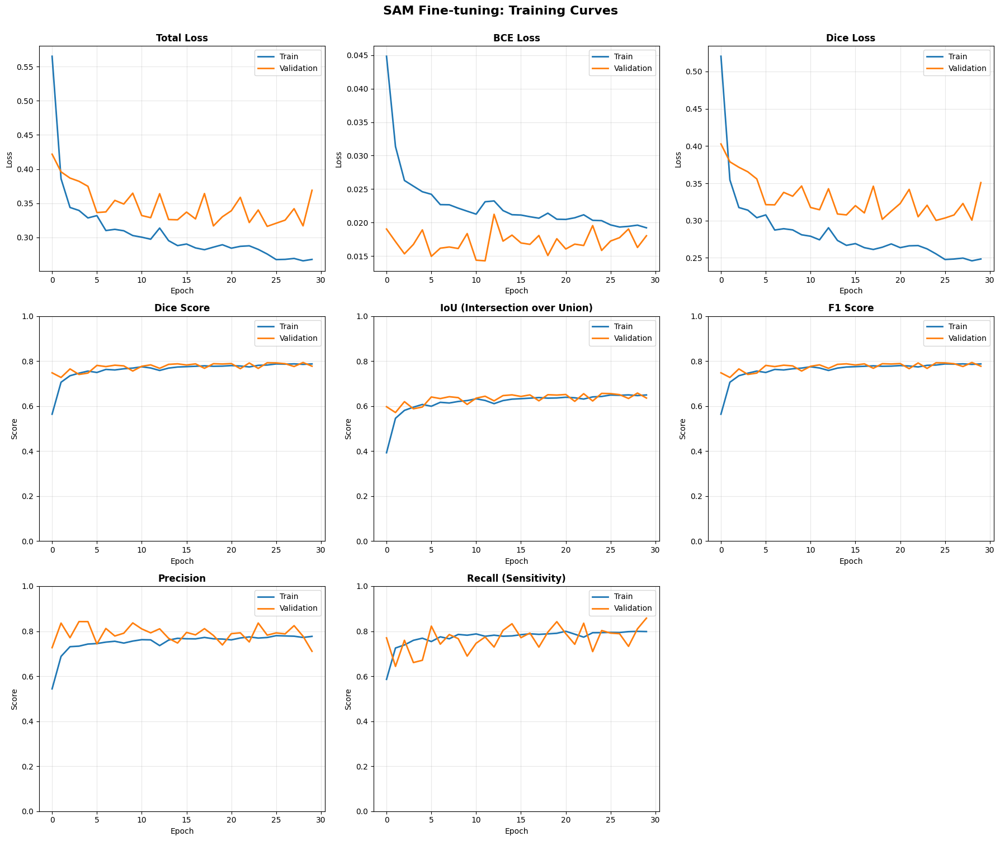

In [ ]:
plot_all_metrics(history)

Loaded best model from epoch 29
Best Validation Dice: 0.7937
Applied LoRA (rank=8) to 12 transformer blocks
Trainable parameters:    4,353,252 (4.63%)
  - LoRA parameters:     294,912
  - Decoder parameters:  4,058,340


Testing: 100%|██████████| 9/9 [00:54<00:00,  6.01s/it]


TILE-LEVEL TEST RESULTS
Loss:          0.2693
  - BCE Loss:  0.0127
  - Dice Loss: 0.2566

Segmentation Metrics:
  Dice:        0.7703
  IoU:         0.6264
  Precision:   0.7533
  Recall:      0.7880
  F1:          0.7703
Visualizing 6 random samples...



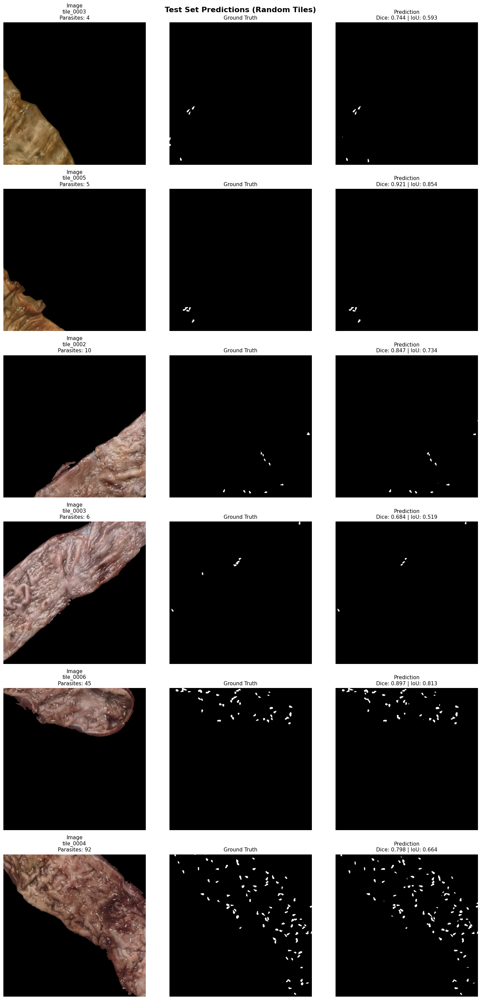

In [ ]:
# Load best checkpoint
best_checkpoint_path = f"{checkpoint_dir}/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval()

test_results = evaluate_on_test(
    fine_tuner=eval_fine_tuner,
    test_dataset=test_dataset,
    batch_size=4,
    visualize=True,
    num_viz_samples=6       # Number of tiles to visualize
)


FULL IMAGE RECONSTRUCTION WITH VISUALIZATION
Testing on 6 images: ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']

Processing: B2025-00231b...
  Reconstructing: 4096 x 2805 (~131.5MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7418 | IoU: 0.5896 | Precision: 0.7685 | Recall: 0.7169

Processing: B2025-00143b...
  Reconstructing: 3707 x 3687 (~156.4MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.7349 | IoU: 0.5809 | Precision: 0.7841 | Recall: 0.6915

Processing: B2025-00206b...
  Reconstructing: 3660 x 3072 (~128.7MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.8318 | IoU: 0.7121 | Precision: 0.8572 | Recall: 0.8079

Processing: B2025-00136b...
  Reconstructing: 4025 x 3433 (~158.1MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.8295 | IoU: 0.7087 | Precision: 0.8609 | Recall: 0.8003

Processing: B2025-00085.2...
  Reconstructing: 3207 x 3581 (~131.4MB, 9 tiles)
  Successfully processed 9/9 tiles
 

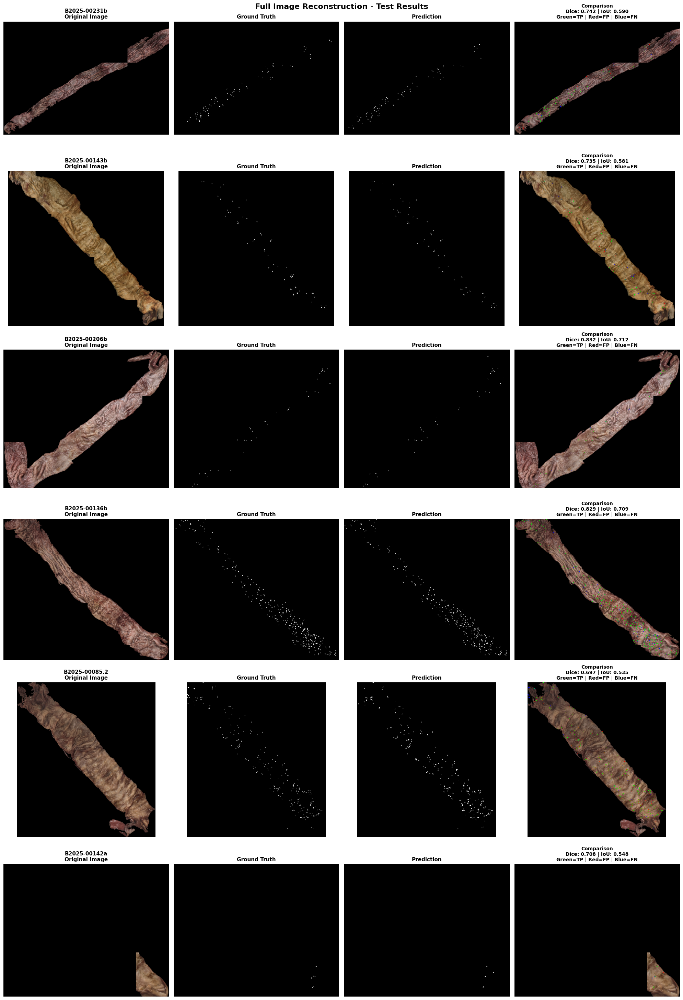

In [ ]:
results_df, visualizations = evaluate_full_images(
    fine_tuner=eval_fine_tuner,
    splits=splits,
    test_dataset=test_dataset,
    max_image_size_mb=300,                  # Skip images larger than 300MB
    process_in_chunks=True,                 # Process tiles in chunks
    chunk_size=30,                          # Clear cache every 30 tiles
)

## Experiment 2 - LoRA 32, Adam, wd=1e-4, BCE=1.0, Dice=1.0

In [ ]:
config = {
      'exp_name': 'new_split_LoRA_Rank32',
      'batch_size': 1,
      'num_epochs': 30,
      'learning_rate': 1e-4,
      'lora_rank': 32,
      'optimizer': 'adam',
      'weight_decay': 1e-4,
      'bce_weight': 1.0,
      'dice_weight': 1.0,
      'grad_clip': None,
      'augmentation': False,
      'scheduler': None,
      'early_stop_patience': 10
}

history, fine_tuner, checkpoint_dir = train_sam_lora(sam_model, train_dataset, val_dataset, config)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/new_split_LoRA_Rank32
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Epoch 1/30 [Train]: 100%|██████████| 229/229 [03:50<00:00,  1.01s/it, loss=0.4258, dice=0.5307, iou=0.3612]



Epoch 1/30
  Train | Loss: 0.6672 | Dice: 0.5307 | IoU: 0.3612
        | Precision: 0.5947 | Recall: 0.4792 | F1: 0.5307
  Val   | Loss: 0.3833 | Dice: 0.7083 | IoU: 0.5483
        | Precision: 0.7970 | Recall: 0.6373 | F1: 0.7083

New best model saved (Dice: 0.7083)



Epoch 2/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2198, dice=0.7292, iou=0.5739]



Epoch 2/30
  Train | Loss: 0.3565 | Dice: 0.7292 | IoU: 0.5739
        | Precision: 0.7215 | Recall: 0.7372 | F1: 0.7292
  Val   | Loss: 0.3635 | Dice: 0.7652 | IoU: 0.6197
        | Precision: 0.7991 | Recall: 0.7341 | F1: 0.7652

New best model saved (Dice: 0.7652)



Epoch 3/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.3301, dice=0.7351, iou=0.5812]



Epoch 3/30
  Train | Loss: 0.3415 | Dice: 0.7351 | IoU: 0.5812
        | Precision: 0.7184 | Recall: 0.7527 | F1: 0.7351
  Val   | Loss: 0.3657 | Dice: 0.7691 | IoU: 0.6249
        | Precision: 0.7955 | Recall: 0.7445 | F1: 0.7691

New best model saved (Dice: 0.7691)



Epoch 4/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.3154, dice=0.7512, iou=0.6015]



Epoch 4/30
  Train | Loss: 0.3291 | Dice: 0.7512 | IoU: 0.6015
        | Precision: 0.7405 | Recall: 0.7621 | F1: 0.7512
  Val   | Loss: 0.3461 | Dice: 0.7772 | IoU: 0.6356
        | Precision: 0.7420 | Recall: 0.8158 | F1: 0.7772

New best model saved (Dice: 0.7772)



Epoch 5/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.3406, dice=0.7568, iou=0.6087]



Epoch 5/30
  Train | Loss: 0.3205 | Dice: 0.7568 | IoU: 0.6087
        | Precision: 0.7451 | Recall: 0.7688 | F1: 0.7568
  Val   | Loss: 0.3629 | Dice: 0.7577 | IoU: 0.6100
        | Precision: 0.8245 | Recall: 0.7009 | F1: 0.7577
Checkpoint saved: epoch_5.pth



Epoch 6/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.3249, dice=0.7567, iou=0.6087]



Epoch 6/30
  Train | Loss: 0.3194 | Dice: 0.7567 | IoU: 0.6087
        | Precision: 0.7354 | Recall: 0.7793 | F1: 0.7567
  Val   | Loss: 0.3433 | Dice: 0.7793 | IoU: 0.6384
        | Precision: 0.7803 | Recall: 0.7783 | F1: 0.7793

New best model saved (Dice: 0.7793)



Epoch 7/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.0552, dice=0.7643, iou=0.6185]



Epoch 7/30
  Train | Loss: 0.3059 | Dice: 0.7643 | IoU: 0.6185
        | Precision: 0.7495 | Recall: 0.7797 | F1: 0.7643
  Val   | Loss: 0.3358 | Dice: 0.7807 | IoU: 0.6403
        | Precision: 0.7665 | Recall: 0.7955 | F1: 0.7807

New best model saved (Dice: 0.7807)



Epoch 8/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.7007, dice=0.7680, iou=0.6234]



Epoch 8/30
  Train | Loss: 0.2962 | Dice: 0.7680 | IoU: 0.6234
        | Precision: 0.7620 | Recall: 0.7741 | F1: 0.7680
  Val   | Loss: 0.3275 | Dice: 0.7820 | IoU: 0.6420
        | Precision: 0.7801 | Recall: 0.7839 | F1: 0.7820

New best model saved (Dice: 0.7820)



Epoch 9/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.4471, dice=0.7724, iou=0.6292]



Epoch 9/30
  Train | Loss: 0.2936 | Dice: 0.7724 | IoU: 0.6292
        | Precision: 0.7623 | Recall: 0.7828 | F1: 0.7724
  Val   | Loss: 0.3285 | Dice: 0.7850 | IoU: 0.6461
        | Precision: 0.7603 | Recall: 0.8115 | F1: 0.7850

New best model saved (Dice: 0.7850)



Epoch 10/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.2674, dice=0.7584, iou=0.6108]



Epoch 10/30
  Train | Loss: 0.3093 | Dice: 0.7584 | IoU: 0.6108
        | Precision: 0.7477 | Recall: 0.7694 | F1: 0.7584
  Val   | Loss: 0.3357 | Dice: 0.7748 | IoU: 0.6323
        | Precision: 0.7705 | Recall: 0.7791 | F1: 0.7748
Checkpoint saved: epoch_10.pth



Epoch 11/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.3418, dice=0.7756, iou=0.6335]



Epoch 11/30
  Train | Loss: 0.2909 | Dice: 0.7756 | IoU: 0.6335
        | Precision: 0.7616 | Recall: 0.7901 | F1: 0.7756
  Val   | Loss: 0.3146 | Dice: 0.7866 | IoU: 0.6483
        | Precision: 0.7726 | Recall: 0.8011 | F1: 0.7866

New best model saved (Dice: 0.7866)



Epoch 12/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=1.0223, dice=0.7779, iou=0.6365]



Epoch 12/30
  Train | Loss: 0.2877 | Dice: 0.7779 | IoU: 0.6365
        | Precision: 0.7637 | Recall: 0.7926 | F1: 0.7779
  Val   | Loss: 0.3121 | Dice: 0.7900 | IoU: 0.6530
        | Precision: 0.7650 | Recall: 0.8168 | F1: 0.7900

New best model saved (Dice: 0.7900)



Epoch 13/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.1052, dice=0.7756, iou=0.6335]



Epoch 13/30
  Train | Loss: 0.2820 | Dice: 0.7756 | IoU: 0.6335
        | Precision: 0.7669 | Recall: 0.7846 | F1: 0.7756
  Val   | Loss: 0.3321 | Dice: 0.7872 | IoU: 0.6491
        | Precision: 0.7923 | Recall: 0.7822 | F1: 0.7872



Epoch 14/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.3636, dice=0.7772, iou=0.6356]



Epoch 14/30
  Train | Loss: 0.2821 | Dice: 0.7772 | IoU: 0.6356
        | Precision: 0.7665 | Recall: 0.7882 | F1: 0.7772
  Val   | Loss: 0.3319 | Dice: 0.7832 | IoU: 0.6436
        | Precision: 0.7605 | Recall: 0.8072 | F1: 0.7832



Epoch 15/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.1701, dice=0.7726, iou=0.6294]



Epoch 15/30
  Train | Loss: 0.2776 | Dice: 0.7726 | IoU: 0.6294
        | Precision: 0.7571 | Recall: 0.7887 | F1: 0.7726
  Val   | Loss: 0.3328 | Dice: 0.7810 | IoU: 0.6406
        | Precision: 0.7503 | Recall: 0.8143 | F1: 0.7810
Checkpoint saved: epoch_15.pth



Epoch 16/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=1.0172, dice=0.7307, iou=0.5757]



Epoch 16/30
  Train | Loss: 0.2930 | Dice: 0.7307 | IoU: 0.5757
        | Precision: 0.6826 | Recall: 0.7862 | F1: 0.7307
  Val   | Loss: 0.3466 | Dice: 0.7871 | IoU: 0.6490
        | Precision: 0.7595 | Recall: 0.8168 | F1: 0.7871



Epoch 17/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2962, dice=0.7812, iou=0.6409]



Epoch 17/30
  Train | Loss: 0.2750 | Dice: 0.7812 | IoU: 0.6409
        | Precision: 0.7744 | Recall: 0.7881 | F1: 0.7812
  Val   | Loss: 0.3275 | Dice: 0.7872 | IoU: 0.6491
        | Precision: 0.7973 | Recall: 0.7773 | F1: 0.7872



Epoch 18/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.3163, dice=0.7779, iou=0.6365]



Epoch 18/30
  Train | Loss: 0.2773 | Dice: 0.7779 | IoU: 0.6365
        | Precision: 0.7679 | Recall: 0.7881 | F1: 0.7779
  Val   | Loss: 0.3227 | Dice: 0.7910 | IoU: 0.6543
        | Precision: 0.7605 | Recall: 0.8242 | F1: 0.7910

New best model saved (Dice: 0.7910)



Epoch 19/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.3051, dice=0.7827, iou=0.6429]



Epoch 19/30
  Train | Loss: 0.2768 | Dice: 0.7827 | IoU: 0.6429
        | Precision: 0.7768 | Recall: 0.7887 | F1: 0.7827
  Val   | Loss: 0.3133 | Dice: 0.7921 | IoU: 0.6558
        | Precision: 0.7748 | Recall: 0.8103 | F1: 0.7921

New best model saved (Dice: 0.7921)



Epoch 20/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.4975, dice=0.7869, iou=0.6487]



Epoch 20/30
  Train | Loss: 0.2729 | Dice: 0.7869 | IoU: 0.6487
        | Precision: 0.7806 | Recall: 0.7932 | F1: 0.7869
  Val   | Loss: 0.3478 | Dice: 0.7904 | IoU: 0.6535
        | Precision: 0.7790 | Recall: 0.8022 | F1: 0.7904
Checkpoint saved: epoch_20.pth



Epoch 21/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2277, dice=0.7863, iou=0.6479]



Epoch 21/30
  Train | Loss: 0.2730 | Dice: 0.7863 | IoU: 0.6479
        | Precision: 0.7764 | Recall: 0.7964 | F1: 0.7863
  Val   | Loss: 0.3410 | Dice: 0.7834 | IoU: 0.6439
        | Precision: 0.7841 | Recall: 0.7827 | F1: 0.7834



Epoch 22/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2923, dice=0.7845, iou=0.6454]



Epoch 22/30
  Train | Loss: 0.2739 | Dice: 0.7845 | IoU: 0.6454
        | Precision: 0.7755 | Recall: 0.7937 | F1: 0.7845
  Val   | Loss: 0.3506 | Dice: 0.7873 | IoU: 0.6493
        | Precision: 0.7479 | Recall: 0.8312 | F1: 0.7873



Epoch 23/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.1055, dice=0.7861, iou=0.6476]



Epoch 23/30
  Train | Loss: 0.2717 | Dice: 0.7861 | IoU: 0.6476
        | Precision: 0.7782 | Recall: 0.7941 | F1: 0.7861
  Val   | Loss: 0.3505 | Dice: 0.7758 | IoU: 0.6337
        | Precision: 0.8222 | Recall: 0.7343 | F1: 0.7758



Epoch 24/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.1807, dice=0.7895, iou=0.6522]



Epoch 24/30
  Train | Loss: 0.2632 | Dice: 0.7895 | IoU: 0.6522
        | Precision: 0.7793 | Recall: 0.8000 | F1: 0.7895
  Val   | Loss: 0.3298 | Dice: 0.7862 | IoU: 0.6477
        | Precision: 0.7691 | Recall: 0.8040 | F1: 0.7862



Epoch 25/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2349, dice=0.7931, iou=0.6571]



Epoch 25/30
  Train | Loss: 0.2524 | Dice: 0.7931 | IoU: 0.6571
        | Precision: 0.7905 | Recall: 0.7957 | F1: 0.7931
  Val   | Loss: 0.3280 | Dice: 0.7911 | IoU: 0.6544
        | Precision: 0.7705 | Recall: 0.8129 | F1: 0.7911
Checkpoint saved: epoch_25.pth



Epoch 26/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.3350, dice=0.7897, iou=0.6524]



Epoch 26/30
  Train | Loss: 0.2657 | Dice: 0.7897 | IoU: 0.6524
        | Precision: 0.7855 | Recall: 0.7938 | F1: 0.7897
  Val   | Loss: 0.3158 | Dice: 0.7898 | IoU: 0.6527
        | Precision: 0.7925 | Recall: 0.7872 | F1: 0.7898



Epoch 27/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.1464, dice=0.7916, iou=0.6551]



Epoch 27/30
  Train | Loss: 0.2544 | Dice: 0.7916 | IoU: 0.6551
        | Precision: 0.7812 | Recall: 0.8023 | F1: 0.7916
  Val   | Loss: 0.3250 | Dice: 0.7888 | IoU: 0.6513
        | Precision: 0.7924 | Recall: 0.7853 | F1: 0.7888



Epoch 28/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2033, dice=0.7964, iou=0.6617]



Epoch 28/30
  Train | Loss: 0.2510 | Dice: 0.7964 | IoU: 0.6617
        | Precision: 0.7866 | Recall: 0.8065 | F1: 0.7964
  Val   | Loss: 0.3191 | Dice: 0.7935 | IoU: 0.6577
        | Precision: 0.7703 | Recall: 0.8182 | F1: 0.7935

New best model saved (Dice: 0.7935)



Epoch 29/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.2494, dice=0.7926, iou=0.6564]



Epoch 29/30
  Train | Loss: 0.2522 | Dice: 0.7926 | IoU: 0.6564
        | Precision: 0.7915 | Recall: 0.7936 | F1: 0.7926
  Val   | Loss: 0.3647 | Dice: 0.7728 | IoU: 0.6297
        | Precision: 0.8209 | Recall: 0.7300 | F1: 0.7728



Epoch 30/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.2420, dice=0.7940, iou=0.6583]



Epoch 30/30
  Train | Loss: 0.2560 | Dice: 0.7940 | IoU: 0.6583
        | Precision: 0.7847 | Recall: 0.8034 | F1: 0.7940
  Val   | Loss: 0.3318 | Dice: 0.7838 | IoU: 0.6445
        | Precision: 0.7849 | Recall: 0.7827 | F1: 0.7838
Checkpoint saved: epoch_30.pth



Loaded best model from epoch 28
Best Validation Dice: 0.7935
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Testing: 100%|██████████| 36/36 [01:22<00:00,  2.28s/it]


TILE-LEVEL TEST RESULTS
Loss:          0.2695
  - BCE Loss:  0.0138
  - Dice Loss: 0.2557

Segmentation Metrics:
  Dice:        0.7664
  IoU:         0.6213
  Precision:   0.7495
  Recall:      0.7840
  F1:          0.7664
Visualizing 6 random samples...



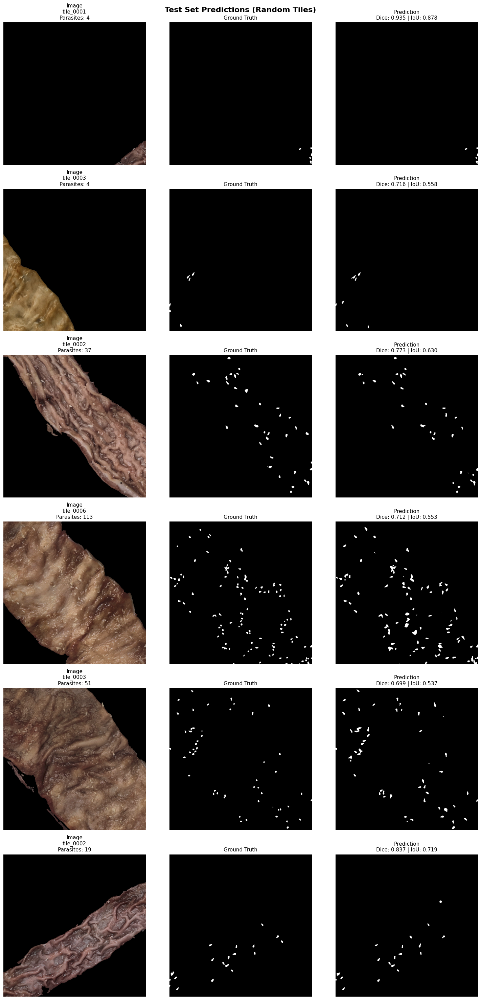

In [ ]:
# Load best checkpoint
best_checkpoint_path = f"{checkpoint_dir}/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval()

test_results = evaluate_on_test(
    fine_tuner=eval_fine_tuner,
    test_dataset=test_dataset,
    batch_size=1,
    visualize=True,
    num_viz_samples=6       # Number of tiles to visualize
)


FULL IMAGE RECONSTRUCTION WITH VISUALIZATION
Testing on 6 images: ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']

Processing: B2025-00231b...
  Reconstructing: 4096 x 2805 (~131.5MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7577 | IoU: 0.6099 | Precision: 0.7759 | Recall: 0.7403

Processing: B2025-00143b...
  Reconstructing: 3707 x 3687 (~156.4MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.7166 | IoU: 0.5584 | Precision: 0.7462 | Recall: 0.6893

Processing: B2025-00206b...
  Reconstructing: 3660 x 3072 (~128.7MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.8242 | IoU: 0.7010 | Precision: 0.8408 | Recall: 0.8082

Processing: B2025-00136b...
  Reconstructing: 4025 x 3433 (~158.1MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.8220 | IoU: 0.6977 | Precision: 0.8581 | Recall: 0.7887

Processing: B2025-00085.2...
  Reconstructing: 3207 x 3581 (~131.4MB, 9 tiles)
  Successfully processed 9/9 tiles
 

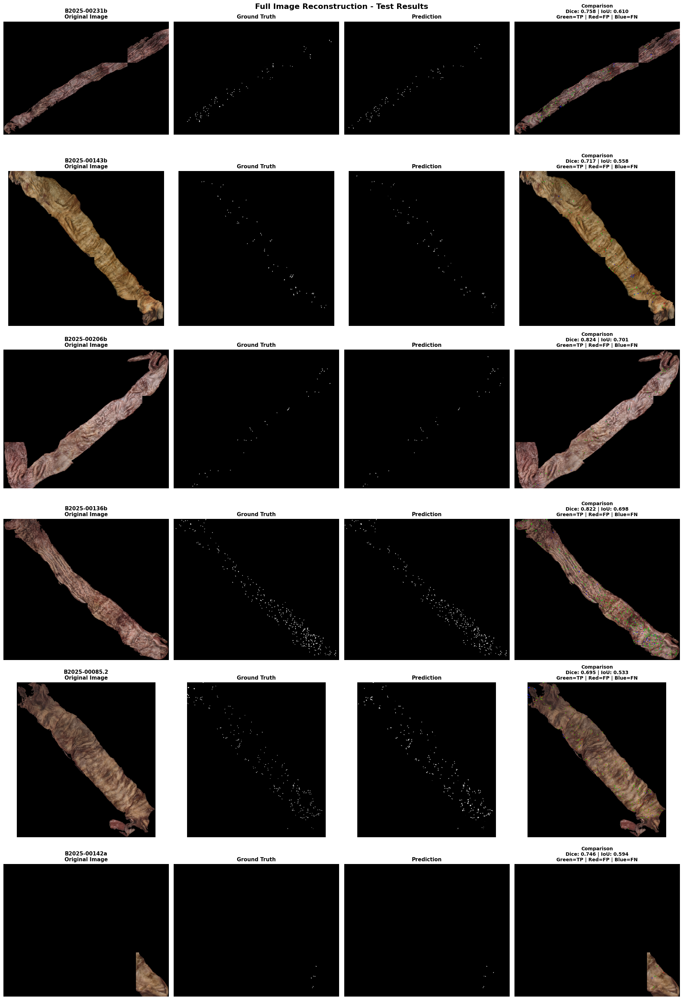

In [ ]:
results_df, visualizations = evaluate_full_images(
    fine_tuner=eval_fine_tuner,
    splits=splits,
    test_dataset=test_dataset,
    max_image_size_mb=300,                  # Skip images larger than 300MB
    process_in_chunks=True,                 # Process tiles in chunks
    chunk_size=30,                          # Clear cache every 30 tiles
)

## Experiment 3 - LoRA 32, AdamW, pos_weight=2.0

In [ ]:
sam_model, device = load_sam_model()

config = {
      'exp_name': 'new_split_LoRA_Rank64',
      'batch_size': 1,
      'num_epochs': 30,
      'learning_rate': 1e-4,
      'lora_rank': 32,
      'optimizer': 'adamw',
      'weight_decay': 1e-4,
      'bce_weight': 1.0,
      'dice_weight': 1.0,
      'pos_weight': 2.0,
      'grad_clip': 1.0,  # Stability
      'augmentation': False,
      'scheduler': 'cosine',  # Add LR scheduling
      'early_stop_patience': 10

}

history, fine_tuner, checkpoint_dir = train_sam_lora(sam_model, train_dataset, val_dataset, config)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/new_split_LoRA_Rank64
Applied LoRA (rank=32) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340
Using CosineAnnealingLR scheduler


Epoch 1/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.05it/s, loss=0.1553, dice=0.5684, iou=0.3970]



Epoch 1/30
  Train | Loss: 0.4960 | Dice: 0.5684 | IoU: 0.3970
        | Precision: 0.4995 | Recall: 0.6594 | F1: 0.5684
  Val   | Loss: 0.4158 | Dice: 0.7576 | IoU: 0.6098
        | Precision: 0.8026 | Recall: 0.7174 | F1: 0.7576

New best model saved (Dice: 0.7576)



Epoch 2/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.04it/s, loss=0.3777, dice=0.7356, iou=0.5818]



Epoch 2/30
  Train | Loss: 0.3650 | Dice: 0.7356 | IoU: 0.5818
        | Precision: 0.7085 | Recall: 0.7650 | F1: 0.7356
  Val   | Loss: 0.3917 | Dice: 0.7659 | IoU: 0.6206
        | Precision: 0.6931 | Recall: 0.8557 | F1: 0.7659

New best model saved (Dice: 0.7659)



Epoch 3/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.05it/s, loss=0.1086, dice=0.7529, iou=0.6037]



Epoch 3/30
  Train | Loss: 0.3410 | Dice: 0.7529 | IoU: 0.6037
        | Precision: 0.7391 | Recall: 0.7672 | F1: 0.7529
  Val   | Loss: 0.3771 | Dice: 0.7720 | IoU: 0.6286
        | Precision: 0.8099 | Recall: 0.7374 | F1: 0.7720

New best model saved (Dice: 0.7720)



Epoch 4/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=0.3183, dice=0.7638, iou=0.6179]



Epoch 4/30
  Train | Loss: 0.3240 | Dice: 0.7638 | IoU: 0.6179
        | Precision: 0.7500 | Recall: 0.7782 | F1: 0.7638
  Val   | Loss: 0.3571 | Dice: 0.7806 | IoU: 0.6401
        | Precision: 0.7826 | Recall: 0.7785 | F1: 0.7806

New best model saved (Dice: 0.7806)



Epoch 5/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.04it/s, loss=0.5123, dice=0.7687, iou=0.6243]



Epoch 5/30
  Train | Loss: 0.3130 | Dice: 0.7687 | IoU: 0.6243
        | Precision: 0.7532 | Recall: 0.7848 | F1: 0.7687
  Val   | Loss: 0.3538 | Dice: 0.7772 | IoU: 0.6356
        | Precision: 0.7190 | Recall: 0.8457 | F1: 0.7772
Checkpoint saved: epoch_5.pth



Epoch 6/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.05it/s, loss=0.3096, dice=0.7703, iou=0.6264]



Epoch 6/30
  Train | Loss: 0.3143 | Dice: 0.7703 | IoU: 0.6264
        | Precision: 0.7637 | Recall: 0.7770 | F1: 0.7703
  Val   | Loss: 0.3556 | Dice: 0.7844 | IoU: 0.6453
        | Precision: 0.7591 | Recall: 0.8115 | F1: 0.7844

New best model saved (Dice: 0.7844)



Epoch 7/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.04it/s, loss=0.3940, dice=0.7790, iou=0.6380]



Epoch 7/30
  Train | Loss: 0.2969 | Dice: 0.7790 | IoU: 0.6380
        | Precision: 0.7566 | Recall: 0.8028 | F1: 0.7790
  Val   | Loss: 0.4094 | Dice: 0.7558 | IoU: 0.6074
        | Precision: 0.8443 | Recall: 0.6841 | F1: 0.7558



Epoch 8/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2791, dice=0.7822, iou=0.6423]



Epoch 8/30
  Train | Loss: 0.2964 | Dice: 0.7822 | IoU: 0.6423
        | Precision: 0.7745 | Recall: 0.7902 | F1: 0.7822
  Val   | Loss: 0.3343 | Dice: 0.7889 | IoU: 0.6514
        | Precision: 0.7608 | Recall: 0.8192 | F1: 0.7889

New best model saved (Dice: 0.7889)



Epoch 9/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.04it/s, loss=0.2589, dice=0.7754, iou=0.6332]



Epoch 9/30
  Train | Loss: 0.2877 | Dice: 0.7754 | IoU: 0.6332
        | Precision: 0.7488 | Recall: 0.8040 | F1: 0.7754
  Val   | Loss: 0.3726 | Dice: 0.7707 | IoU: 0.6270
        | Precision: 0.8302 | Recall: 0.7192 | F1: 0.7707



Epoch 10/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.3954, dice=0.7839, iou=0.6446]



Epoch 10/30
  Train | Loss: 0.2865 | Dice: 0.7839 | IoU: 0.6446
        | Precision: 0.7718 | Recall: 0.7964 | F1: 0.7839
  Val   | Loss: 0.3747 | Dice: 0.7829 | IoU: 0.6432
        | Precision: 0.7985 | Recall: 0.7678 | F1: 0.7829
Checkpoint saved: epoch_10.pth



Epoch 11/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=0.3709, dice=0.7901, iou=0.6531]



Epoch 11/30
  Train | Loss: 0.2781 | Dice: 0.7901 | IoU: 0.6531
        | Precision: 0.7733 | Recall: 0.8077 | F1: 0.7901
  Val   | Loss: 0.3526 | Dice: 0.7865 | IoU: 0.6481
        | Precision: 0.8009 | Recall: 0.7726 | F1: 0.7865



Epoch 12/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.1942, dice=0.7894, iou=0.6521]



Epoch 12/30
  Train | Loss: 0.2785 | Dice: 0.7894 | IoU: 0.6521
        | Precision: 0.7785 | Recall: 0.8006 | F1: 0.7894
  Val   | Loss: 0.3534 | Dice: 0.7877 | IoU: 0.6497
        | Precision: 0.7321 | Recall: 0.8524 | F1: 0.7877



Epoch 13/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2728, dice=0.7923, iou=0.6561]



Epoch 13/30
  Train | Loss: 0.2754 | Dice: 0.7923 | IoU: 0.6561
        | Precision: 0.7765 | Recall: 0.8088 | F1: 0.7923
  Val   | Loss: 0.3338 | Dice: 0.7931 | IoU: 0.6571
        | Precision: 0.8021 | Recall: 0.7843 | F1: 0.7931

New best model saved (Dice: 0.7931)



Epoch 14/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=0.2787, dice=0.7974, iou=0.6631]



Epoch 14/30
  Train | Loss: 0.2654 | Dice: 0.7974 | IoU: 0.6631
        | Precision: 0.7820 | Recall: 0.8135 | F1: 0.7974
  Val   | Loss: 0.3617 | Dice: 0.7909 | IoU: 0.6542
        | Precision: 0.7828 | Recall: 0.7992 | F1: 0.7909



Epoch 15/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2895, dice=0.7994, iou=0.6659]



Epoch 15/30
  Train | Loss: 0.2645 | Dice: 0.7994 | IoU: 0.6659
        | Precision: 0.7836 | Recall: 0.8159 | F1: 0.7994
  Val   | Loss: 0.3724 | Dice: 0.7891 | IoU: 0.6517
        | Precision: 0.8042 | Recall: 0.7745 | F1: 0.7891
Checkpoint saved: epoch_15.pth



Epoch 16/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=0.1249, dice=0.8000, iou=0.6667]



Epoch 16/30
  Train | Loss: 0.2572 | Dice: 0.8000 | IoU: 0.6667
        | Precision: 0.7864 | Recall: 0.8142 | F1: 0.8000
  Val   | Loss: 0.3995 | Dice: 0.7809 | IoU: 0.6405
        | Precision: 0.8113 | Recall: 0.7527 | F1: 0.7809



Epoch 17/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.3050, dice=0.8044, iou=0.6728]



Epoch 17/30
  Train | Loss: 0.2525 | Dice: 0.8044 | IoU: 0.6728
        | Precision: 0.7914 | Recall: 0.8178 | F1: 0.8044
  Val   | Loss: 0.3579 | Dice: 0.7941 | IoU: 0.6584
        | Precision: 0.7874 | Recall: 0.8008 | F1: 0.7941

New best model saved (Dice: 0.7941)



Epoch 18/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=0.1041, dice=0.8036, iou=0.6717]



Epoch 18/30
  Train | Loss: 0.2536 | Dice: 0.8036 | IoU: 0.6717
        | Precision: 0.7868 | Recall: 0.8211 | F1: 0.8036
  Val   | Loss: 0.3746 | Dice: 0.7867 | IoU: 0.6484
        | Precision: 0.7831 | Recall: 0.7904 | F1: 0.7867



Epoch 19/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2063, dice=0.8057, iou=0.6746]



Epoch 19/30
  Train | Loss: 0.2495 | Dice: 0.8057 | IoU: 0.6746
        | Precision: 0.7911 | Recall: 0.8208 | F1: 0.8057
  Val   | Loss: 0.3462 | Dice: 0.7924 | IoU: 0.6561
        | Precision: 0.7675 | Recall: 0.8189 | F1: 0.7924



Epoch 20/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2006, dice=0.8077, iou=0.6774]



Epoch 20/30
  Train | Loss: 0.2451 | Dice: 0.8077 | IoU: 0.6774
        | Precision: 0.7929 | Recall: 0.8230 | F1: 0.8077
  Val   | Loss: 0.3676 | Dice: 0.7930 | IoU: 0.6571
        | Precision: 0.7767 | Recall: 0.8101 | F1: 0.7930
Checkpoint saved: epoch_20.pth



Epoch 21/30 [Train]: 100%|██████████| 229/229 [03:39<00:00,  1.04it/s, loss=0.2157, dice=0.8100, iou=0.6807]



Epoch 21/30
  Train | Loss: 0.2448 | Dice: 0.8100 | IoU: 0.6807
        | Precision: 0.7919 | Recall: 0.8290 | F1: 0.8100
  Val   | Loss: 0.3727 | Dice: 0.7897 | IoU: 0.6525
        | Precision: 0.8032 | Recall: 0.7767 | F1: 0.7897



Epoch 22/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2427, dice=0.8095, iou=0.6800]



Epoch 22/30
  Train | Loss: 0.2417 | Dice: 0.8095 | IoU: 0.6800
        | Precision: 0.7936 | Recall: 0.8261 | F1: 0.8095
  Val   | Loss: 0.3617 | Dice: 0.7908 | IoU: 0.6540
        | Precision: 0.7856 | Recall: 0.7961 | F1: 0.7908



Epoch 23/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.0969, dice=0.8105, iou=0.6814]



Epoch 23/30
  Train | Loss: 0.2404 | Dice: 0.8105 | IoU: 0.6814
        | Precision: 0.7957 | Recall: 0.8259 | F1: 0.8105
  Val   | Loss: 0.3583 | Dice: 0.7925 | IoU: 0.6564
        | Precision: 0.7856 | Recall: 0.7996 | F1: 0.7925



Epoch 24/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.1923, dice=0.8137, iou=0.6859]



Epoch 24/30
  Train | Loss: 0.2364 | Dice: 0.8137 | IoU: 0.6859
        | Precision: 0.8010 | Recall: 0.8269 | F1: 0.8137
  Val   | Loss: 0.3557 | Dice: 0.7947 | IoU: 0.6594
        | Precision: 0.7835 | Recall: 0.8063 | F1: 0.7947

New best model saved (Dice: 0.7947)



Epoch 25/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=1.0247, dice=0.8121, iou=0.6836]



Epoch 25/30
  Train | Loss: 0.2371 | Dice: 0.8121 | IoU: 0.6836
        | Precision: 0.7937 | Recall: 0.8313 | F1: 0.8121
  Val   | Loss: 0.3640 | Dice: 0.7917 | IoU: 0.6552
        | Precision: 0.7961 | Recall: 0.7872 | F1: 0.7917
Checkpoint saved: epoch_25.pth



Epoch 26/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.3046, dice=0.8124, iou=0.6841]



Epoch 26/30
  Train | Loss: 0.2339 | Dice: 0.8124 | IoU: 0.6841
        | Precision: 0.7990 | Recall: 0.8263 | F1: 0.8124
  Val   | Loss: 0.3508 | Dice: 0.7943 | IoU: 0.6588
        | Precision: 0.7896 | Recall: 0.7991 | F1: 0.7943



Epoch 27/30 [Train]: 100%|██████████| 229/229 [03:36<00:00,  1.06it/s, loss=0.1357, dice=0.8124, iou=0.6841]



Epoch 27/30
  Train | Loss: 0.2345 | Dice: 0.8124 | IoU: 0.6841
        | Precision: 0.7962 | Recall: 0.8293 | F1: 0.8124
  Val   | Loss: 0.3559 | Dice: 0.7935 | IoU: 0.6576
        | Precision: 0.7945 | Recall: 0.7924 | F1: 0.7935



Epoch 28/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.2817, dice=0.8155, iou=0.6885]



Epoch 28/30
  Train | Loss: 0.2287 | Dice: 0.8155 | IoU: 0.6885
        | Precision: 0.8002 | Recall: 0.8314 | F1: 0.8155
  Val   | Loss: 0.3508 | Dice: 0.7949 | IoU: 0.6596
        | Precision: 0.7850 | Recall: 0.8051 | F1: 0.7949

New best model saved (Dice: 0.7949)



Epoch 29/30 [Train]: 100%|██████████| 229/229 [03:38<00:00,  1.05it/s, loss=0.2146, dice=0.8131, iou=0.6851]



Epoch 29/30
  Train | Loss: 0.2311 | Dice: 0.8131 | IoU: 0.6851
        | Precision: 0.7982 | Recall: 0.8286 | F1: 0.8131
  Val   | Loss: 0.3556 | Dice: 0.7947 | IoU: 0.6594
        | Precision: 0.7864 | Recall: 0.8032 | F1: 0.7947



Epoch 30/30 [Train]: 100%|██████████| 229/229 [03:37<00:00,  1.05it/s, loss=0.4182, dice=0.8134, iou=0.6854]



Epoch 30/30
  Train | Loss: 0.2325 | Dice: 0.8134 | IoU: 0.6854
        | Precision: 0.7987 | Recall: 0.8286 | F1: 0.8134
  Val   | Loss: 0.3560 | Dice: 0.7945 | IoU: 0.6590
        | Precision: 0.7894 | Recall: 0.7996 | F1: 0.7945
Checkpoint saved: epoch_30.pth



Loaded best model from epoch 28
Best Validation Dice: 0.7949
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Testing: 100%|██████████| 9/9 [01:18<00:00,  8.78s/it]


TILE-LEVEL TEST RESULTS
Loss:          0.2772
  - BCE Loss:  0.0130
  - Dice Loss: 0.2642

Segmentation Metrics:
  Dice:        0.7700
  IoU:         0.6260
  Precision:   0.7696
  Recall:      0.7704
  F1:          0.7700
Visualizing 6 random samples...



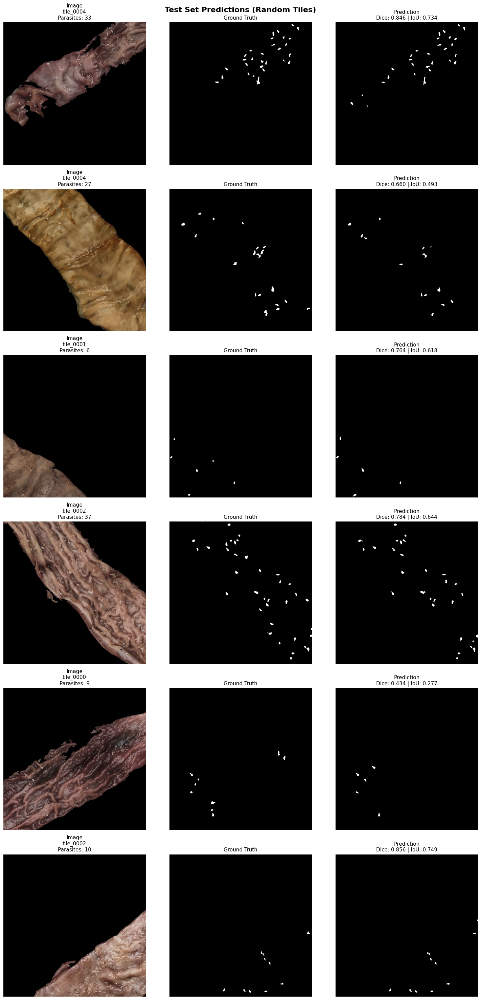

In [ ]:
# Load best checkpoint
best_checkpoint_path = f"{checkpoint_dir}/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval()

test_results = evaluate_on_test(
    fine_tuner=eval_fine_tuner,
    test_dataset=test_dataset,
    batch_size=4,
    visualize=True,         # Show some example predictions
    num_viz_samples=6       # Number of tiles to visualize
)


FULL IMAGE RECONSTRUCTION WITH VISUALIZATION
Testing on 6 images: ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']

Processing: B2025-00231b...
  Reconstructing: 4096 x 2805 (~131.5MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7485 | IoU: 0.5981 | Precision: 0.8177 | Recall: 0.6902

Processing: B2025-00143b...
  Reconstructing: 3707 x 3687 (~156.4MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.7152 | IoU: 0.5567 | Precision: 0.8022 | Recall: 0.6452

Processing: B2025-00206b...
  Reconstructing: 3660 x 3072 (~128.7MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7498 | IoU: 0.5997 | Precision: 0.8543 | Recall: 0.6681

Processing: B2025-00136b...
  Reconstructing: 4025 x 3433 (~158.1MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.8361 | IoU: 0.7184 | Precision: 0.8800 | Recall: 0.7964

Processing: B2025-00085.2...
  Reconstructing: 3207 x 3581 (~131.4MB, 9 tiles)
  Successfully processed 9/9 tiles
 

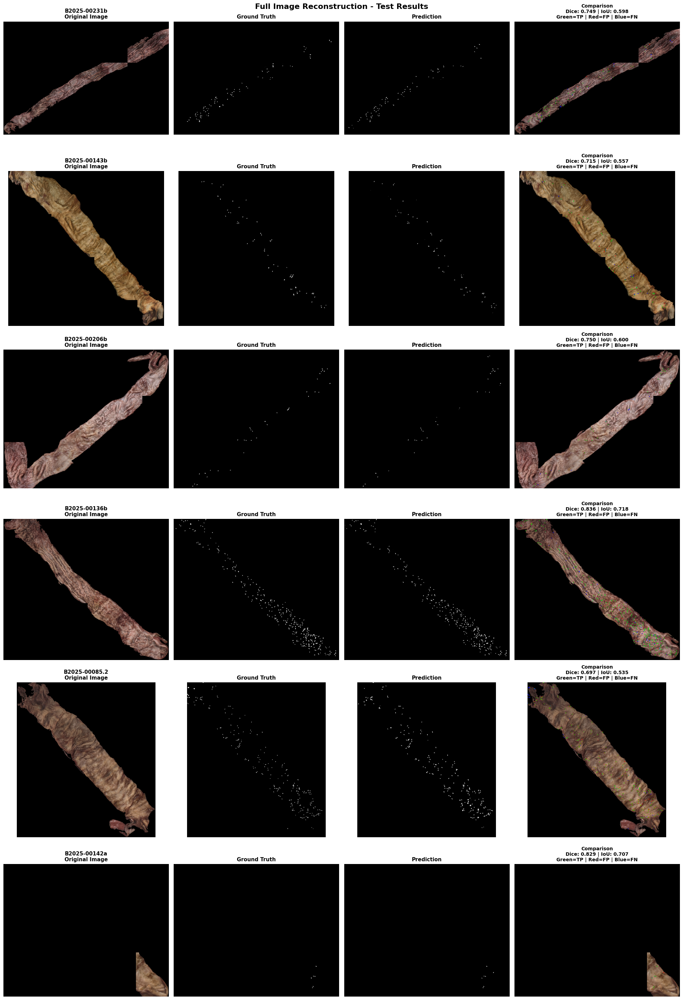

In [ ]:
results_df, visualizations = evaluate_full_images(
    fine_tuner=eval_fine_tuner,
    splits=splits,
    test_dataset=test_dataset,
    max_image_size_mb=300,                  # Skip images larger than 300MB
    process_in_chunks=True,                 # Process tiles in chunks
    chunk_size=30,                          # Clear cache every 30 tiles
)

## Experiment 4 - LoRA 32, Adam, dice_weight=2.0, pos_weight=2.0

In [ ]:
sam_model, device = load_sam_model()

config= {
      'exp_name': 'new_split_LoRA_WeightedBCE',
      'batch_size': 1,
      'num_epochs': 30,
      'learning_rate': 1e-4,
      'lora_rank': 32,
      'optimizer': 'adam',
      'weight_decay': 1e-4,
      'bce_weight': 1.0,
      'dice_weight': 2.0,
      'pos_weight': 2.0,
      'grad_clip': None,
      'augmentation': False,
      'scheduler': None,
      'early_stop_patience': 8
  }
history, fine_tuner, checkpoint_dir = train_sam_lora(sam_model, train_dataset, val_dataset, config)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/new_split_LoRA_WeightedBCE
Applied LoRA (rank=32) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Epoch 1/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.5507, dice=0.5981, iou=0.4267]



Epoch 1/30
  Train | Loss: 1.0101 | Dice: 0.5981 | IoU: 0.4267
        | Precision: 0.5494 | Recall: 0.6564 | F1: 0.5981
  Val   | Loss: 0.7681 | Dice: 0.7645 | IoU: 0.6188
        | Precision: 0.7381 | Recall: 0.7930 | F1: 0.7645

New best model saved (Dice: 0.7645)



Epoch 2/30 [Train]: 100%|██████████| 229/229 [03:49<00:00,  1.00s/it, loss=0.5214, dice=0.7337, iou=0.5794]



Epoch 2/30
  Train | Loss: 0.6902 | Dice: 0.7337 | IoU: 0.5794
        | Precision: 0.7146 | Recall: 0.7538 | F1: 0.7337
  Val   | Loss: 0.6862 | Dice: 0.7743 | IoU: 0.6318
        | Precision: 0.8012 | Recall: 0.7492 | F1: 0.7743

New best model saved (Dice: 0.7743)



Epoch 3/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=1.3007, dice=0.7495, iou=0.5994]



Epoch 3/30
  Train | Loss: 0.6497 | Dice: 0.7495 | IoU: 0.5994
        | Precision: 0.7338 | Recall: 0.7660 | F1: 0.7495
  Val   | Loss: 0.6616 | Dice: 0.7749 | IoU: 0.6325
        | Precision: 0.8110 | Recall: 0.7418 | F1: 0.7749

New best model saved (Dice: 0.7749)



Epoch 4/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=1.0045, dice=0.7509, iou=0.6011]



Epoch 4/30
  Train | Loss: 0.6390 | Dice: 0.7509 | IoU: 0.6011
        | Precision: 0.7294 | Recall: 0.7737 | F1: 0.7509
  Val   | Loss: 0.7260 | Dice: 0.7834 | IoU: 0.6439
        | Precision: 0.7497 | Recall: 0.8204 | F1: 0.7834

New best model saved (Dice: 0.7834)



Epoch 5/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.3909, dice=0.7542, iou=0.6053]



Epoch 5/30
  Train | Loss: 0.6243 | Dice: 0.7542 | IoU: 0.6053
        | Precision: 0.7373 | Recall: 0.7718 | F1: 0.7542
  Val   | Loss: 0.7358 | Dice: 0.7807 | IoU: 0.6403
        | Precision: 0.7302 | Recall: 0.8388 | F1: 0.7807
Checkpoint saved: epoch_5.pth



Epoch 6/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.00it/s, loss=0.4701, dice=0.7616, iou=0.6150]



Epoch 6/30
  Train | Loss: 0.6197 | Dice: 0.7616 | IoU: 0.6150
        | Precision: 0.7430 | Recall: 0.7812 | F1: 0.7616
  Val   | Loss: 0.6442 | Dice: 0.7915 | IoU: 0.6550
        | Precision: 0.7949 | Recall: 0.7882 | F1: 0.7915

New best model saved (Dice: 0.7915)



Epoch 7/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.4065, dice=0.7614, iou=0.6147]



Epoch 7/30
  Train | Loss: 0.5980 | Dice: 0.7614 | IoU: 0.6147
        | Precision: 0.7366 | Recall: 0.7879 | F1: 0.7614
  Val   | Loss: 0.6435 | Dice: 0.7855 | IoU: 0.6468
        | Precision: 0.7895 | Recall: 0.7815 | F1: 0.7855



Epoch 8/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.4973, dice=0.7700, iou=0.6260]



Epoch 8/30
  Train | Loss: 0.5741 | Dice: 0.7700 | IoU: 0.6260
        | Precision: 0.7441 | Recall: 0.7977 | F1: 0.7700
  Val   | Loss: 0.6818 | Dice: 0.7736 | IoU: 0.6307
        | Precision: 0.7195 | Recall: 0.8364 | F1: 0.7736



Epoch 9/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.4576, dice=0.7579, iou=0.6101]



Epoch 9/30
  Train | Loss: 0.6027 | Dice: 0.7579 | IoU: 0.6101
        | Precision: 0.7426 | Recall: 0.7738 | F1: 0.7579
  Val   | Loss: 0.6270 | Dice: 0.7896 | IoU: 0.6523
        | Precision: 0.7720 | Recall: 0.8080 | F1: 0.7896



Epoch 10/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.4842, dice=0.7724, iou=0.6292]



Epoch 10/30
  Train | Loss: 0.5710 | Dice: 0.7724 | IoU: 0.6292
        | Precision: 0.7553 | Recall: 0.7904 | F1: 0.7724
  Val   | Loss: 0.7056 | Dice: 0.7835 | IoU: 0.6441
        | Precision: 0.7544 | Recall: 0.8150 | F1: 0.7835
Checkpoint saved: epoch_10.pth



Epoch 11/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.3339, dice=0.7584, iou=0.6108]



Epoch 11/30
  Train | Loss: 0.5852 | Dice: 0.7584 | IoU: 0.6108
        | Precision: 0.7279 | Recall: 0.7915 | F1: 0.7584
  Val   | Loss: 0.6714 | Dice: 0.7871 | IoU: 0.6490
        | Precision: 0.7772 | Recall: 0.7973 | F1: 0.7871



Epoch 12/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.6559, dice=0.7751, iou=0.6328]



Epoch 12/30
  Train | Loss: 0.5588 | Dice: 0.7751 | IoU: 0.6328
        | Precision: 0.7590 | Recall: 0.7919 | F1: 0.7751
  Val   | Loss: 0.6383 | Dice: 0.7888 | IoU: 0.6512
        | Precision: 0.7482 | Recall: 0.8340 | F1: 0.7888



Epoch 13/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.6657, dice=0.7787, iou=0.6376]



Epoch 13/30
  Train | Loss: 0.5499 | Dice: 0.7787 | IoU: 0.6376
        | Precision: 0.7595 | Recall: 0.7989 | F1: 0.7787
  Val   | Loss: 0.7682 | Dice: 0.7527 | IoU: 0.6034
        | Precision: 0.7681 | Recall: 0.7378 | F1: 0.7527



Epoch 14/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.1254, dice=0.7712, iou=0.6276]



Epoch 14/30
  Train | Loss: 0.5616 | Dice: 0.7712 | IoU: 0.6276
        | Precision: 0.7496 | Recall: 0.7941 | F1: 0.7712
  Val   | Loss: 0.7180 | Dice: 0.7486 | IoU: 0.5982
        | Precision: 0.8492 | Recall: 0.6694 | F1: 0.7486

Early stopping triggered at epoch 14


Loaded best model from epoch 6
Best Validation Dice: 0.7915
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Testing: 100%|██████████| 9/9 [01:17<00:00,  8.61s/it]


TILE-LEVEL TEST RESULTS
Loss:          0.5336
  - BCE Loss:  0.0168
  - Dice Loss: 0.2584

Segmentation Metrics:
  Dice:        0.7607
  IoU:         0.6138
  Precision:   0.7842
  Recall:      0.7385
  F1:          0.7607
Visualizing 6 random samples...



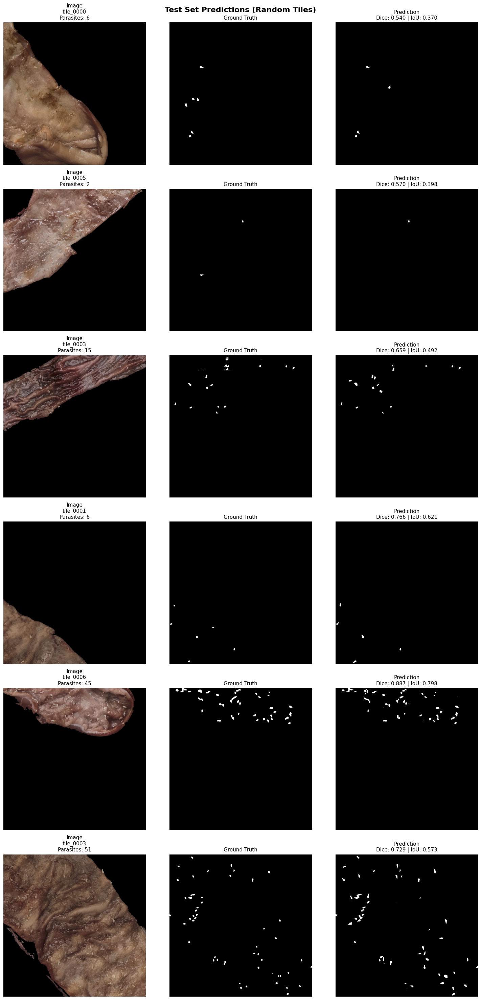

In [ ]:
# Load best checkpoint
best_checkpoint_path = f"{checkpoint_dir}/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval()

test_results = evaluate_on_test(
    fine_tuner=eval_fine_tuner,
    test_dataset=test_dataset,
    batch_size=4,
    visualize=True,         # Show some example predictions
    num_viz_samples=6       # Number of tiles to visualize
)


FULL IMAGE RECONSTRUCTION WITH VISUALIZATION
Testing on 6 images: ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']

Processing: B2025-00231b...
  Reconstructing: 4096 x 2805 (~131.5MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7530 | IoU: 0.6038 | Precision: 0.8120 | Recall: 0.7019

Processing: B2025-00143b...
  Reconstructing: 3707 x 3687 (~156.4MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.7300 | IoU: 0.5748 | Precision: 0.8146 | Recall: 0.6613

Processing: B2025-00206b...
  Reconstructing: 3660 x 3072 (~128.7MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.8229 | IoU: 0.6991 | Precision: 0.8815 | Recall: 0.7717

Processing: B2025-00136b...
  Reconstructing: 4025 x 3433 (~158.1MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.8078 | IoU: 0.6775 | Precision: 0.8842 | Recall: 0.7435

Processing: B2025-00085.2...
  Reconstructing: 3207 x 3581 (~131.4MB, 9 tiles)
  Successfully processed 9/9 tiles
 

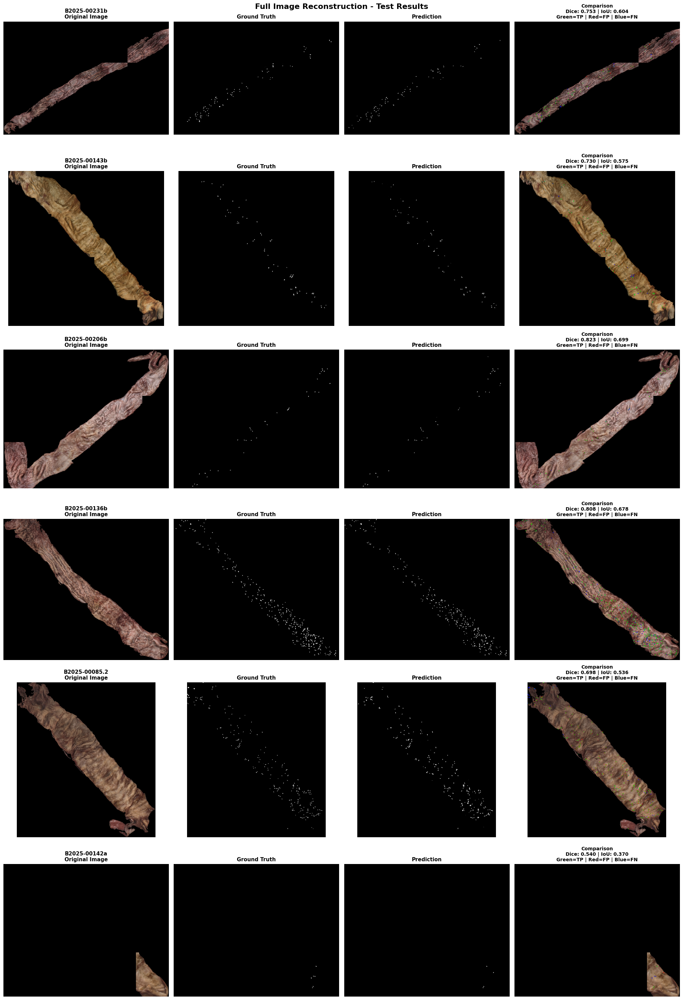

In [ ]:
results_df, visualizations = evaluate_full_images(
    fine_tuner=eval_fine_tuner,
    splits=splits,
    test_dataset=test_dataset,
    max_image_size_mb=300,                  # Skip images larger than 300MB
    process_in_chunks=True,                 # Process tiles in chunks
    chunk_size=30,                          # Clear cache every 30 tiles
)

## Experiment 5 -  Aug, LoRA 32, AdamW

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SAMDatasetNoPrompt(Dataset):
    """Dataset for SAM fine-tuning with Albumentations"""

    def __init__(self, image_ids, output_dir, augment=False, transform=None):
        """
        Args:
            image_ids: List of image IDs
            output_dir: Directory containing processed tiles
            augment: Whether to use augmentation (for backward compatibility)
            transform: Albumentations transform pipeline (overrides augment if provided)
        """
        self.samples = []
        self.augment = augment
        self.transform = transform  # Albumentations transform

        for img_id in image_ids:
            tiles_dir = os.path.join(output_dir, img_id, "tiles")
            masks_dir = os.path.join(output_dir, img_id, "masks")
            annotations_dir = os.path.join(output_dir, img_id, "annotations")

            if not os.path.exists(tiles_dir):
                continue

            tile_files = [f for f in os.listdir(tiles_dir) if f.endswith('.png')]

            for tile_file in tile_files:
                tile_id = tile_file.replace('.png', '')
                tile_path = os.path.join(tiles_dir, tile_file)
                mask_path = os.path.join(masks_dir, f"{tile_id}.png")
                anno_path = os.path.join(annotations_dir, f"{tile_id}.json")

                if os.path.exists(mask_path) and os.path.exists(anno_path):
                    with open(anno_path, 'r') as f:
                        anno = json.load(f)

                    self.samples.append({
                        'tile_path': tile_path,
                        'mask_path': mask_path,
                        'tile_id': tile_id,
                        'base_image_id': img_id,
                        'num_parasites': anno['num_parasites']
                    })

        aug_type = "Albumentations" if self.transform else ("Basic" if self.augment else "None")
        print(f"Loaded {len(self.samples)} samples (augmentation={aug_type})")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]

        # Load image and mask
        image = cv2.imread(sample['tile_path'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(sample['mask_path'], cv2.IMREAD_GRAYSCALE)

        # Binary mask (0 or 1)
        binary_mask = (mask > 127).astype(np.uint8)

        # Apply Albumentations transform if provided
        if self.transform is not None:
            transformed = self.transform(image=image, mask=binary_mask)
            image = transformed['image']
            mask_tensor = transformed['mask']

            # Normalize image to [0, 1] for SAM
            image_tensor = image.float() / 255.0

            # Ensure mask is float and has correct shape [1, H, W]
            if mask_tensor.dim() == 2:
                mask_tensor = mask_tensor.unsqueeze(0)
            mask_tensor = mask_tensor.float()

        # Fallback to basic augmentation (for backward compatibility)
        elif self.augment:
            if random.random() > 0.5:
                image = cv2.flip(image, 1).copy()
                binary_mask = cv2.flip(binary_mask, 1).copy()
            if random.random() > 0.5:
                image = cv2.flip(image, 0).copy()
                binary_mask = cv2.flip(binary_mask, 0).copy()
            if random.random() > 0.5:
                k = random.choice([1, 2, 3])
                image = np.rot90(image, k).copy()
                binary_mask = np.rot90(binary_mask, k).copy()

            # Convert to tensors
            image_tensor = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
            mask_tensor = torch.from_numpy(binary_mask).unsqueeze(0).float()

        # No augmentation
        else:
            image_tensor = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
            mask_tensor = torch.from_numpy(binary_mask).unsqueeze(0).float()

        return {
            'image': image_tensor,
            'mask': mask_tensor,
            'tile_id': sample['tile_id'],
            'num_parasites': sample['num_parasites']
        }

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transforms = A.Compose([
    # Geometric augmentations
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.25),
    A.Rotate(limit=5, p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.25,
        rotate_limit=0,
        p=0.5,
        border_mode=cv2.BORDER_CONSTANT,
        value=0,
        mask_value=0
    ),
    A.Affine(
        shear=(-2, 2),
        p=0.3,
        mode=cv2.BORDER_CONSTANT,
        cval=0,
        cval_mask=0
    ),

    # Color augmentations
    A.HueSaturationValue(
        hue_shift_limit=int(0.015 * 180),
        sat_shift_limit=int(0.7 * 255),
        val_shift_limit=int(0.4 * 255),
        p=0.9
    ),

    # Additional augmentations
    A.OneOf([
        A.GaussianBlur(blur_limit=3, p=1.0),
        A.MedianBlur(blur_limit=3, p=1.0),
    ], p=0.1),

    A.RandomBrightnessContrast(
        brightness_limit=0.2,
        contrast_limit=0.2,
        p=0.5
    ),

    # Convert to tensor (image will be normalized to [0,1] in __getitem__)
    ToTensorV2(),
])

# Validation: No augmentation, just convert to tensor
val_transforms = A.Compose([
    ToTensorV2(),
])

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-3488974880.py:10: UserWarning: Argument(s) 'value, mask_value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
/tmp/ipython-input-3488974880.py:19: UserWarning: Argument(s) 'mode, cval, cval_mask' are not valid for transform Affine
  A.Affine(


In [ ]:
# Create datasets
train_dataset = SAMDatasetNoPrompt(
    image_ids=splits['train'],
    output_dir=output_dir,
    transform=train_transforms
)

val_dataset = SAMDatasetNoPrompt(
    image_ids=splits['val'],
    output_dir=output_dir,
    transform=val_transforms
)

test_dataset = SAMDatasetNoPrompt(
    image_ids=splits['test'],
    output_dir=output_dir,
    transform=val_transforms
)


Loaded 229 samples (augmentation=Albumentations)
Loaded 30 samples (augmentation=Albumentations)
Loaded 36 samples (augmentation=Albumentations)


In [ ]:
sam_model, device = load_sam_model()

config = {
    'exp_name': 'new_split_LoRA_HeavyAug',
    'batch_size': 1,
    'num_epochs': 30,
    'learning_rate': 1e-4,
    'lora_rank': 32,
    'optimizer': 'adamw',
    'weight_decay': 1e-4,
    'bce_weight': 1.0,
    'dice_weight': 1.0,
    'grad_clip': None,
    'scheduler': None,
    'early_stop_patience': 10
}

history, fine_tuner, checkpoint_dir = train_sam_lora(sam_model, train_dataset, val_dataset, config)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/new_split_LoRA_HeavyAug
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Epoch 1/30 [Train]: 100%|██████████| 229/229 [03:35<00:00,  1.06it/s, loss=0.1172, dice=0.4050, iou=0.2539]



Epoch 1/30
  Train | Loss: 0.6910 | Dice: 0.4050 | IoU: 0.2539
        | Precision: 0.3531 | Recall: 0.4747 | F1: 0.4050
  Val   | Loss: 0.4289 | Dice: 0.7499 | IoU: 0.5999
        | Precision: 0.7383 | Recall: 0.7620 | F1: 0.7499

New best model saved (Dice: 0.7499)



Epoch 2/30 [Train]: 100%|██████████| 229/229 [03:44<00:00,  1.02it/s, loss=0.3472, dice=0.6363, iou=0.4666]



Epoch 2/30
  Train | Loss: 0.4991 | Dice: 0.6363 | IoU: 0.4666
        | Precision: 0.6244 | Recall: 0.6486 | F1: 0.6363
  Val   | Loss: 0.3662 | Dice: 0.7694 | IoU: 0.6252
        | Precision: 0.7590 | Recall: 0.7801 | F1: 0.7694

New best model saved (Dice: 0.7694)



Epoch 3/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.4371, dice=0.6756, iou=0.5101]



Epoch 3/30
  Train | Loss: 0.4484 | Dice: 0.6756 | IoU: 0.5101
        | Precision: 0.6887 | Recall: 0.6629 | F1: 0.6756
  Val   | Loss: 0.3498 | Dice: 0.7582 | IoU: 0.6106
        | Precision: 0.8148 | Recall: 0.7090 | F1: 0.7582



Epoch 4/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.2939, dice=0.6841, iou=0.5199]



Epoch 4/30
  Train | Loss: 0.4442 | Dice: 0.6841 | IoU: 0.5199
        | Precision: 0.6897 | Recall: 0.6786 | F1: 0.6841
  Val   | Loss: 0.3329 | Dice: 0.7655 | IoU: 0.6200
        | Precision: 0.8123 | Recall: 0.7237 | F1: 0.7655



Epoch 5/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.5715, dice=0.6809, iou=0.5162]



Epoch 5/30
  Train | Loss: 0.4411 | Dice: 0.6809 | IoU: 0.5162
        | Precision: 0.6905 | Recall: 0.6716 | F1: 0.6809
  Val   | Loss: 0.3433 | Dice: 0.7629 | IoU: 0.6166
        | Precision: 0.7948 | Recall: 0.7334 | F1: 0.7629
Checkpoint saved: epoch_5.pth



Epoch 6/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.2153, dice=0.7051, iou=0.5446]



Epoch 6/30
  Train | Loss: 0.4275 | Dice: 0.7051 | IoU: 0.5446
        | Precision: 0.7015 | Recall: 0.7088 | F1: 0.7051
  Val   | Loss: 0.3371 | Dice: 0.7784 | IoU: 0.6372
        | Precision: 0.7859 | Recall: 0.7711 | F1: 0.7784

New best model saved (Dice: 0.7784)



Epoch 7/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.5355, dice=0.7054, iou=0.5449]



Epoch 7/30
  Train | Loss: 0.4225 | Dice: 0.7054 | IoU: 0.5449
        | Precision: 0.7198 | Recall: 0.6916 | F1: 0.7054
  Val   | Loss: 0.3302 | Dice: 0.7818 | IoU: 0.6417
        | Precision: 0.7877 | Recall: 0.7759 | F1: 0.7818

New best model saved (Dice: 0.7818)



Epoch 8/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.2094, dice=0.7082, iou=0.5482]



Epoch 8/30
  Train | Loss: 0.3895 | Dice: 0.7082 | IoU: 0.5482
        | Precision: 0.7091 | Recall: 0.7073 | F1: 0.7082
  Val   | Loss: 0.3309 | Dice: 0.7705 | IoU: 0.6267
        | Precision: 0.8104 | Recall: 0.7343 | F1: 0.7705



Epoch 9/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.2512, dice=0.7026, iou=0.5416]



Epoch 9/30
  Train | Loss: 0.4178 | Dice: 0.7026 | IoU: 0.5416
        | Precision: 0.7002 | Recall: 0.7050 | F1: 0.7026
  Val   | Loss: 0.3689 | Dice: 0.7740 | IoU: 0.6313
        | Precision: 0.7510 | Recall: 0.7985 | F1: 0.7740



Epoch 10/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.3220, dice=0.7003, iou=0.5388]



Epoch 10/30
  Train | Loss: 0.4034 | Dice: 0.7003 | IoU: 0.5388
        | Precision: 0.7099 | Recall: 0.6909 | F1: 0.7003
  Val   | Loss: 0.3483 | Dice: 0.7760 | IoU: 0.6340
        | Precision: 0.8023 | Recall: 0.7514 | F1: 0.7760
Checkpoint saved: epoch_10.pth



Epoch 11/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.3198, dice=0.6911, iou=0.5280]



Epoch 11/30
  Train | Loss: 0.4016 | Dice: 0.6911 | IoU: 0.5280
        | Precision: 0.6892 | Recall: 0.6931 | F1: 0.6911
  Val   | Loss: 0.3275 | Dice: 0.7855 | IoU: 0.6468
        | Precision: 0.7928 | Recall: 0.7784 | F1: 0.7855

New best model saved (Dice: 0.7855)



Epoch 12/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.2821, dice=0.7145, iou=0.5559]



Epoch 12/30
  Train | Loss: 0.3988 | Dice: 0.7145 | IoU: 0.5559
        | Precision: 0.7153 | Recall: 0.7137 | F1: 0.7145
  Val   | Loss: 0.3226 | Dice: 0.7915 | IoU: 0.6549
        | Precision: 0.7679 | Recall: 0.8166 | F1: 0.7915

New best model saved (Dice: 0.7915)



Epoch 13/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.1496, dice=0.7265, iou=0.5705]



Epoch 13/30
  Train | Loss: 0.3737 | Dice: 0.7265 | IoU: 0.5705
        | Precision: 0.7309 | Recall: 0.7222 | F1: 0.7265
  Val   | Loss: 0.3314 | Dice: 0.7880 | IoU: 0.6501
        | Precision: 0.7565 | Recall: 0.8222 | F1: 0.7880



Epoch 14/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.2964, dice=0.7332, iou=0.5788]



Epoch 14/30
  Train | Loss: 0.3706 | Dice: 0.7332 | IoU: 0.5788
        | Precision: 0.7313 | Recall: 0.7352 | F1: 0.7332
  Val   | Loss: 0.3192 | Dice: 0.7875 | IoU: 0.6494
        | Precision: 0.7805 | Recall: 0.7945 | F1: 0.7875



Epoch 15/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.2984, dice=0.6862, iou=0.5223]



Epoch 15/30
  Train | Loss: 0.3949 | Dice: 0.6862 | IoU: 0.5223
        | Precision: 0.6958 | Recall: 0.6768 | F1: 0.6862
  Val   | Loss: 0.3404 | Dice: 0.7772 | IoU: 0.6356
        | Precision: 0.7866 | Recall: 0.7679 | F1: 0.7772
Checkpoint saved: epoch_15.pth



Epoch 16/30 [Train]: 100%|██████████| 229/229 [03:47<00:00,  1.01it/s, loss=0.2189, dice=0.7080, iou=0.5480]



Epoch 16/30
  Train | Loss: 0.3830 | Dice: 0.7080 | IoU: 0.5480
        | Precision: 0.7116 | Recall: 0.7044 | F1: 0.7080
  Val   | Loss: 0.3342 | Dice: 0.7769 | IoU: 0.6351
        | Precision: 0.8016 | Recall: 0.7536 | F1: 0.7769



Epoch 17/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.02it/s, loss=0.4677, dice=0.7213, iou=0.5641]



Epoch 17/30
  Train | Loss: 0.3668 | Dice: 0.7213 | IoU: 0.5641
        | Precision: 0.7275 | Recall: 0.7152 | F1: 0.7213
  Val   | Loss: 0.3299 | Dice: 0.7850 | IoU: 0.6461
        | Precision: 0.7834 | Recall: 0.7865 | F1: 0.7850



Epoch 18/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.2182, dice=0.7273, iou=0.5715]



Epoch 18/30
  Train | Loss: 0.3767 | Dice: 0.7273 | IoU: 0.5715
        | Precision: 0.7239 | Recall: 0.7309 | F1: 0.7273
  Val   | Loss: 0.3157 | Dice: 0.7900 | IoU: 0.6528
        | Precision: 0.7601 | Recall: 0.8223 | F1: 0.7900



Epoch 19/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.3345, dice=0.7285, iou=0.5729]



Epoch 19/30
  Train | Loss: 0.3779 | Dice: 0.7285 | IoU: 0.5729
        | Precision: 0.7324 | Recall: 0.7246 | F1: 0.7285
  Val   | Loss: 0.3711 | Dice: 0.7832 | IoU: 0.6437
        | Precision: 0.7542 | Recall: 0.8145 | F1: 0.7832



Epoch 20/30 [Train]: 100%|██████████| 229/229 [03:46<00:00,  1.01it/s, loss=0.4305, dice=0.7212, iou=0.5639]



Epoch 20/30
  Train | Loss: 0.3867 | Dice: 0.7212 | IoU: 0.5639
        | Precision: 0.7234 | Recall: 0.7189 | F1: 0.7212
  Val   | Loss: 0.3280 | Dice: 0.7761 | IoU: 0.6342
        | Precision: 0.8159 | Recall: 0.7401 | F1: 0.7761
Checkpoint saved: epoch_20.pth



Epoch 21/30 [Train]: 100%|██████████| 229/229 [03:48<00:00,  1.00it/s, loss=0.1553, dice=0.7120, iou=0.5528]



Epoch 21/30
  Train | Loss: 0.3999 | Dice: 0.7120 | IoU: 0.5528
        | Precision: 0.7263 | Recall: 0.6983 | F1: 0.7120
  Val   | Loss: 0.3397 | Dice: 0.7888 | IoU: 0.6513
        | Precision: 0.7808 | Recall: 0.7970 | F1: 0.7888



Epoch 22/30 [Train]: 100%|██████████| 229/229 [03:45<00:00,  1.01it/s, loss=0.2266, dice=0.7243, iou=0.5677]



Epoch 22/30
  Train | Loss: 0.3716 | Dice: 0.7243 | IoU: 0.5677
        | Precision: 0.7213 | Recall: 0.7272 | F1: 0.7243
  Val   | Loss: 0.3330 | Dice: 0.7820 | IoU: 0.6420
        | Precision: 0.8063 | Recall: 0.7591 | F1: 0.7820

Early stopping triggered at epoch 22


Loaded best model from epoch 12
Best Validation Dice: 0.7915
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Testing: 100%|██████████| 9/9 [00:18<00:00,  2.00s/it]


TILE-LEVEL TEST RESULTS
Loss:          0.2608
  - BCE Loss:  0.0131
  - Dice Loss: 0.2476

Segmentation Metrics:
  Dice:        0.7685
  IoU:         0.6240
  Precision:   0.7364
  Recall:      0.8035
  F1:          0.7685
Visualizing 6 random samples...



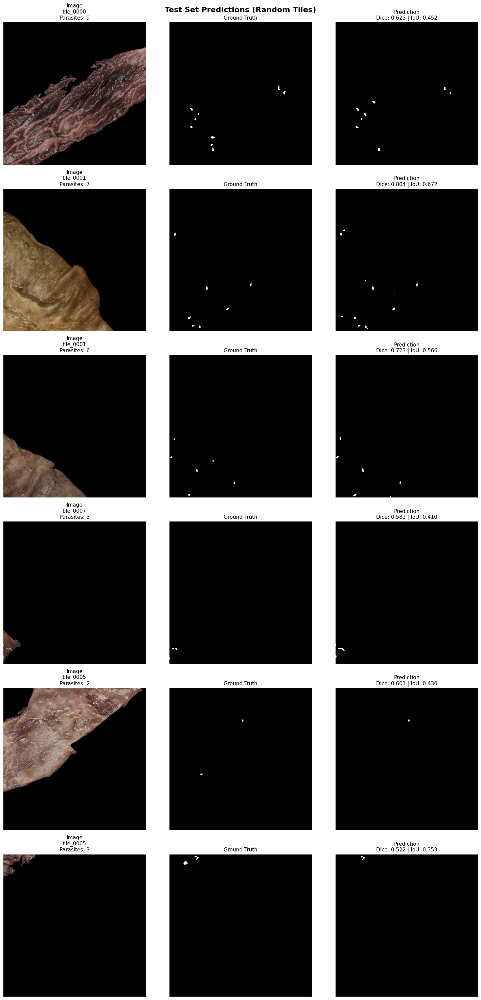

In [ ]:
# Load best checkpoint
best_checkpoint_path = f"{checkpoint_dir}/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval()

test_results = evaluate_on_test(
    fine_tuner=eval_fine_tuner,
    test_dataset=test_dataset,
    batch_size=4,
    visualize=True,         # Show some example predictions
    num_viz_samples=6       # Number of tiles to visualize
)


FULL IMAGE RECONSTRUCTION WITH VISUALIZATION
Testing on 6 images: ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']

Processing: B2025-00231b...
  Reconstructing: 4096 x 2805 (~131.5MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7735 | IoU: 0.6306 | Precision: 0.7867 | Recall: 0.7607

Processing: B2025-00143b...
  Reconstructing: 3707 x 3687 (~156.4MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.7740 | IoU: 0.6314 | Precision: 0.7798 | Recall: 0.7684

Processing: B2025-00206b...
  Reconstructing: 3660 x 3072 (~128.7MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.8104 | IoU: 0.6812 | Precision: 0.7950 | Recall: 0.8264

Processing: B2025-00136b...
  Reconstructing: 4025 x 3433 (~158.1MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.8213 | IoU: 0.6968 | Precision: 0.8490 | Recall: 0.7954

Processing: B2025-00085.2...
  Reconstructing: 3207 x 3581 (~131.4MB, 9 tiles)
  Successfully processed 9/9 tiles
 

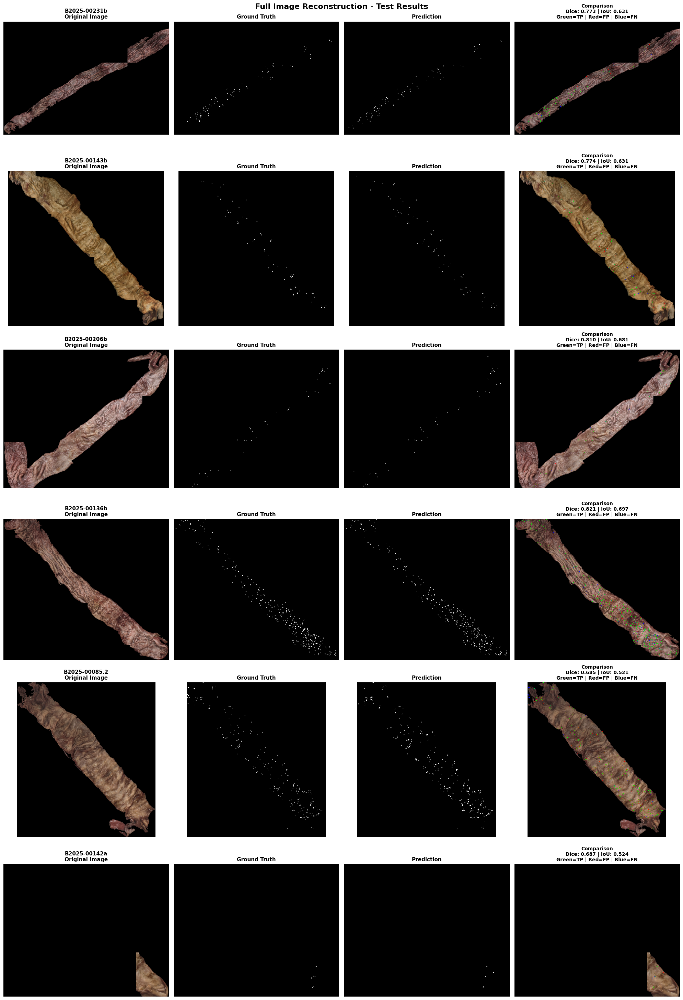

In [ ]:
results_df, visualizations = evaluate_full_images(
    fine_tuner=eval_fine_tuner,
    splits=splits,
    test_dataset=test_dataset,
    max_image_size_mb=300,                  # Skip images larger than 300MB
    process_in_chunks=True,                 # Process tiles in chunks
    chunk_size=30,                          # Clear cache every 30 tiles
)

## Experiment 6 - Aug, LoRA 32, AdamW, pos_weight=2.0

In [ ]:
sam_model, device = load_sam_model()

config = {
    'exp_name': '32_aug_pos',
    'batch_size': 1,
    'num_epochs': 30,
    'learning_rate': 1e-4,
    'lora_rank': 32,
    'optimizer': 'adamw',
    'weight_decay': 1e-4,
    'bce_weight': 1.0,
    'dice_weight': 1.0,
    'pos_weight': 2.0,
    'grad_clip': None,
    'scheduler': None,
    'early_stop_patience': 10
}

history, fine_tuner, checkpoint_dir = train_sam_lora(sam_model, train_dataset, val_dataset, config)

Checkpoints will be saved to: /content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/32_aug_pos
Applied LoRA (rank=32) to 12 transformer blocks
Using pos_weight=2.0 (prioritizing detection recall)
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Epoch 1/30 [Train]: 100%|██████████| 229/229 [03:55<00:00,  1.03s/it, loss=1.0207, dice=0.5019, iou=0.3350]



Epoch 1/30
  Train | Loss: 0.7010 | Dice: 0.5019 | IoU: 0.3350
        | Precision: 0.5287 | Recall: 0.4777 | F1: 0.5019
  Val   | Loss: 0.5876 | Dice: 0.6523 | IoU: 0.4840
        | Precision: 0.5187 | Recall: 0.8786 | F1: 0.6523

New best model saved (Dice: 0.6523)



Epoch 2/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.03s/it, loss=1.1574, dice=0.6635, iou=0.4965]



Epoch 2/30
  Train | Loss: 0.4964 | Dice: 0.6635 | IoU: 0.4965
        | Precision: 0.6647 | Recall: 0.6623 | F1: 0.6635
  Val   | Loss: 0.4391 | Dice: 0.7495 | IoU: 0.5994
        | Precision: 0.6806 | Recall: 0.8341 | F1: 0.7495

New best model saved (Dice: 0.7495)



Epoch 3/30 [Train]: 100%|██████████| 229/229 [03:56<00:00,  1.03s/it, loss=1.0955, dice=0.6965, iou=0.5344]



Epoch 3/30
  Train | Loss: 0.4555 | Dice: 0.6965 | IoU: 0.5344
        | Precision: 0.6942 | Recall: 0.6989 | F1: 0.6965
  Val   | Loss: 0.3739 | Dice: 0.7685 | IoU: 0.6240
        | Precision: 0.7409 | Recall: 0.7982 | F1: 0.7685

New best model saved (Dice: 0.7685)



Epoch 4/30 [Train]: 100%|██████████| 229/229 [03:57<00:00,  1.04s/it, loss=1.2707, dice=0.7105, iou=0.5510]



Epoch 4/30
  Train | Loss: 0.4373 | Dice: 0.7105 | IoU: 0.5510
        | Precision: 0.7104 | Recall: 0.7106 | F1: 0.7105
  Val   | Loss: 0.3395 | Dice: 0.7808 | IoU: 0.6404
        | Precision: 0.7578 | Recall: 0.8053 | F1: 0.7808

New best model saved (Dice: 0.7808)



Epoch 5/30 [Train]: 100%|██████████| 229/229 [03:56<00:00,  1.03s/it, loss=0.9908, dice=0.7096, iou=0.5499]



Epoch 5/30
  Train | Loss: 0.4252 | Dice: 0.7096 | IoU: 0.5499
        | Precision: 0.7059 | Recall: 0.7134 | F1: 0.7096
  Val   | Loss: 0.3377 | Dice: 0.7792 | IoU: 0.6382
        | Precision: 0.7883 | Recall: 0.7703 | F1: 0.7792
Checkpoint saved: epoch_5.pth



Epoch 6/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.0385, dice=0.7112, iou=0.5519]



Epoch 6/30
  Train | Loss: 0.4226 | Dice: 0.7112 | IoU: 0.5519
        | Precision: 0.7145 | Recall: 0.7080 | F1: 0.7112
  Val   | Loss: 0.3382 | Dice: 0.7801 | IoU: 0.6395
        | Precision: 0.7225 | Recall: 0.8476 | F1: 0.7801



Epoch 7/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.1723, dice=0.7042, iou=0.5434]



Epoch 7/30
  Train | Loss: 0.4275 | Dice: 0.7042 | IoU: 0.5434
        | Precision: 0.6908 | Recall: 0.7181 | F1: 0.7042
  Val   | Loss: 0.3885 | Dice: 0.7672 | IoU: 0.6223
        | Precision: 0.6979 | Recall: 0.8516 | F1: 0.7672



Epoch 8/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.1522, dice=0.7103, iou=0.5507]



Epoch 8/30
  Train | Loss: 0.4240 | Dice: 0.7103 | IoU: 0.5507
        | Precision: 0.6986 | Recall: 0.7224 | F1: 0.7103
  Val   | Loss: 0.3365 | Dice: 0.7805 | IoU: 0.6400
        | Precision: 0.7868 | Recall: 0.7743 | F1: 0.7805



Epoch 9/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.0799, dice=0.6911, iou=0.5280]



Epoch 9/30
  Train | Loss: 0.4332 | Dice: 0.6911 | IoU: 0.5280
        | Precision: 0.6842 | Recall: 0.6982 | F1: 0.6911
  Val   | Loss: 0.3459 | Dice: 0.7800 | IoU: 0.6393
        | Precision: 0.7607 | Recall: 0.8003 | F1: 0.7800



Epoch 10/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.3039, dice=0.7212, iou=0.5639]



Epoch 10/30
  Train | Loss: 0.4038 | Dice: 0.7212 | IoU: 0.5639
        | Precision: 0.7109 | Recall: 0.7317 | F1: 0.7212
  Val   | Loss: 0.3283 | Dice: 0.7835 | IoU: 0.6441
        | Precision: 0.7678 | Recall: 0.7999 | F1: 0.7835

New best model saved (Dice: 0.7835)
Checkpoint saved: epoch_10.pth



Epoch 11/30 [Train]: 100%|██████████| 229/229 [03:56<00:00,  1.03s/it, loss=1.0682, dice=0.7275, iou=0.5717]



Epoch 11/30
  Train | Loss: 0.4129 | Dice: 0.7275 | IoU: 0.5717
        | Precision: 0.7112 | Recall: 0.7446 | F1: 0.7275
  Val   | Loss: 0.3225 | Dice: 0.7787 | IoU: 0.6376
        | Precision: 0.8003 | Recall: 0.7583 | F1: 0.7787



Epoch 12/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.0214, dice=0.7337, iou=0.5794]



Epoch 12/30
  Train | Loss: 0.3990 | Dice: 0.7337 | IoU: 0.5794
        | Precision: 0.7387 | Recall: 0.7288 | F1: 0.7337
  Val   | Loss: 0.3268 | Dice: 0.7867 | IoU: 0.6484
        | Precision: 0.7930 | Recall: 0.7805 | F1: 0.7867

New best model saved (Dice: 0.7867)



Epoch 13/30 [Train]: 100%|██████████| 229/229 [03:55<00:00,  1.03s/it, loss=1.0946, dice=0.7304, iou=0.5752]



Epoch 13/30
  Train | Loss: 0.3944 | Dice: 0.7304 | IoU: 0.5752
        | Precision: 0.7149 | Recall: 0.7465 | F1: 0.7304
  Val   | Loss: 0.3402 | Dice: 0.7769 | IoU: 0.6352
        | Precision: 0.7925 | Recall: 0.7620 | F1: 0.7769



Epoch 14/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.3491, dice=0.7341, iou=0.5799]



Epoch 14/30
  Train | Loss: 0.3988 | Dice: 0.7341 | IoU: 0.5799
        | Precision: 0.7317 | Recall: 0.7365 | F1: 0.7341
  Val   | Loss: 0.3409 | Dice: 0.7695 | IoU: 0.6254
        | Precision: 0.8431 | Recall: 0.7078 | F1: 0.7695



Epoch 15/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.1024, dice=0.7375, iou=0.5842]



Epoch 15/30
  Train | Loss: 0.3758 | Dice: 0.7375 | IoU: 0.5842
        | Precision: 0.7294 | Recall: 0.7458 | F1: 0.7375
  Val   | Loss: 0.3326 | Dice: 0.7771 | IoU: 0.6355
        | Precision: 0.8051 | Recall: 0.7511 | F1: 0.7771
Checkpoint saved: epoch_15.pth



Epoch 16/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.8801, dice=0.7254, iou=0.5691]



Epoch 16/30
  Train | Loss: 0.3771 | Dice: 0.7254 | IoU: 0.5691
        | Precision: 0.7299 | Recall: 0.7209 | F1: 0.7254
  Val   | Loss: 0.3131 | Dice: 0.7907 | IoU: 0.6539
        | Precision: 0.7754 | Recall: 0.8066 | F1: 0.7907

New best model saved (Dice: 0.7907)



Epoch 17/30 [Train]: 100%|██████████| 229/229 [03:56<00:00,  1.03s/it, loss=1.0398, dice=0.7147, iou=0.5560]



Epoch 17/30
  Train | Loss: 0.3766 | Dice: 0.7147 | IoU: 0.5560
        | Precision: 0.7007 | Recall: 0.7292 | F1: 0.7147
  Val   | Loss: 0.3609 | Dice: 0.7486 | IoU: 0.5982
        | Precision: 0.8502 | Recall: 0.6686 | F1: 0.7486



Epoch 18/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.0098, dice=0.7259, iou=0.5697]



Epoch 18/30
  Train | Loss: 0.3796 | Dice: 0.7259 | IoU: 0.5697
        | Precision: 0.7264 | Recall: 0.7254 | F1: 0.7259
  Val   | Loss: 0.3180 | Dice: 0.7916 | IoU: 0.6550
        | Precision: 0.7563 | Recall: 0.8303 | F1: 0.7916

New best model saved (Dice: 0.7916)



Epoch 19/30 [Train]: 100%|██████████| 229/229 [03:56<00:00,  1.03s/it, loss=1.0049, dice=0.7418, iou=0.5895]



Epoch 19/30
  Train | Loss: 0.3780 | Dice: 0.7418 | IoU: 0.5895
        | Precision: 0.7378 | Recall: 0.7458 | F1: 0.7418
  Val   | Loss: 0.3118 | Dice: 0.7898 | IoU: 0.6526
        | Precision: 0.7364 | Recall: 0.8515 | F1: 0.7898



Epoch 20/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.2766, dice=0.7332, iou=0.5788]



Epoch 20/30
  Train | Loss: 0.3782 | Dice: 0.7332 | IoU: 0.5788
        | Precision: 0.7229 | Recall: 0.7438 | F1: 0.7332
  Val   | Loss: 0.3487 | Dice: 0.7675 | IoU: 0.6227
        | Precision: 0.8330 | Recall: 0.7116 | F1: 0.7675
Checkpoint saved: epoch_20.pth



Epoch 21/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.1217, dice=0.7360, iou=0.5823]



Epoch 21/30
  Train | Loss: 0.3740 | Dice: 0.7360 | IoU: 0.5823
        | Precision: 0.7209 | Recall: 0.7518 | F1: 0.7360
  Val   | Loss: 0.3134 | Dice: 0.7900 | IoU: 0.6528
        | Precision: 0.7809 | Recall: 0.7992 | F1: 0.7900



Epoch 22/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.0170, dice=0.7449, iou=0.5934]



Epoch 22/30
  Train | Loss: 0.3707 | Dice: 0.7449 | IoU: 0.5934
        | Precision: 0.7318 | Recall: 0.7584 | F1: 0.7449
  Val   | Loss: 0.3159 | Dice: 0.7889 | IoU: 0.6514
        | Precision: 0.7509 | Recall: 0.8309 | F1: 0.7889



Epoch 23/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.4137, dice=0.7257, iou=0.5695]



Epoch 23/30
  Train | Loss: 0.3813 | Dice: 0.7257 | IoU: 0.5695
        | Precision: 0.7206 | Recall: 0.7309 | F1: 0.7257
  Val   | Loss: 0.3157 | Dice: 0.7894 | IoU: 0.6520
        | Precision: 0.7814 | Recall: 0.7975 | F1: 0.7894



Epoch 24/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.3191, dice=0.7368, iou=0.5833]



Epoch 24/30
  Train | Loss: 0.3765 | Dice: 0.7368 | IoU: 0.5833
        | Precision: 0.7255 | Recall: 0.7485 | F1: 0.7368
  Val   | Loss: 0.3220 | Dice: 0.7908 | IoU: 0.6540
        | Precision: 0.7762 | Recall: 0.8060 | F1: 0.7908



Epoch 25/30 [Train]: 100%|██████████| 229/229 [03:53<00:00,  1.02s/it, loss=1.0864, dice=0.7381, iou=0.5849]



Epoch 25/30
  Train | Loss: 0.3739 | Dice: 0.7381 | IoU: 0.5849
        | Precision: 0.7356 | Recall: 0.7406 | F1: 0.7381
  Val   | Loss: 0.3542 | Dice: 0.7737 | IoU: 0.6309
        | Precision: 0.6942 | Recall: 0.8737 | F1: 0.7737
Checkpoint saved: epoch_25.pth



Epoch 26/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.4274, dice=0.7382, iou=0.5850]



Epoch 26/30
  Train | Loss: 0.3638 | Dice: 0.7382 | IoU: 0.5850
        | Precision: 0.7272 | Recall: 0.7495 | F1: 0.7382
  Val   | Loss: 0.3222 | Dice: 0.7840 | IoU: 0.6448
        | Precision: 0.7246 | Recall: 0.8542 | F1: 0.7840



Epoch 27/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.1306, dice=0.7359, iou=0.5822]



Epoch 27/30
  Train | Loss: 0.3523 | Dice: 0.7359 | IoU: 0.5822
        | Precision: 0.7314 | Recall: 0.7405 | F1: 0.7359
  Val   | Loss: 0.3448 | Dice: 0.7692 | IoU: 0.6249
        | Precision: 0.6824 | Recall: 0.8812 | F1: 0.7692



Epoch 28/30 [Train]: 100%|██████████| 229/229 [03:54<00:00,  1.02s/it, loss=1.3577, dice=0.7314, iou=0.5766]



Epoch 28/30
  Train | Loss: 0.3692 | Dice: 0.7314 | IoU: 0.5766
        | Precision: 0.7226 | Recall: 0.7405 | F1: 0.7314
  Val   | Loss: 0.3205 | Dice: 0.7900 | IoU: 0.6529
        | Precision: 0.7627 | Recall: 0.8194 | F1: 0.7900

Early stopping triggered at epoch 28


Loaded best model from epoch 18
Best Validation Dice: 0.7916
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340


Testing: 100%|██████████| 9/9 [00:58<00:00,  6.53s/it]


TILE-LEVEL TEST RESULTS
Loss:          0.2632
  - BCE Loss:  0.0117
  - Dice Loss: 0.2514

Segmentation Metrics:
  Dice:        0.7655
  IoU:         0.6200
  Precision:   0.7265
  Recall:      0.8089
  F1:          0.7655
Visualizing 6 random samples...



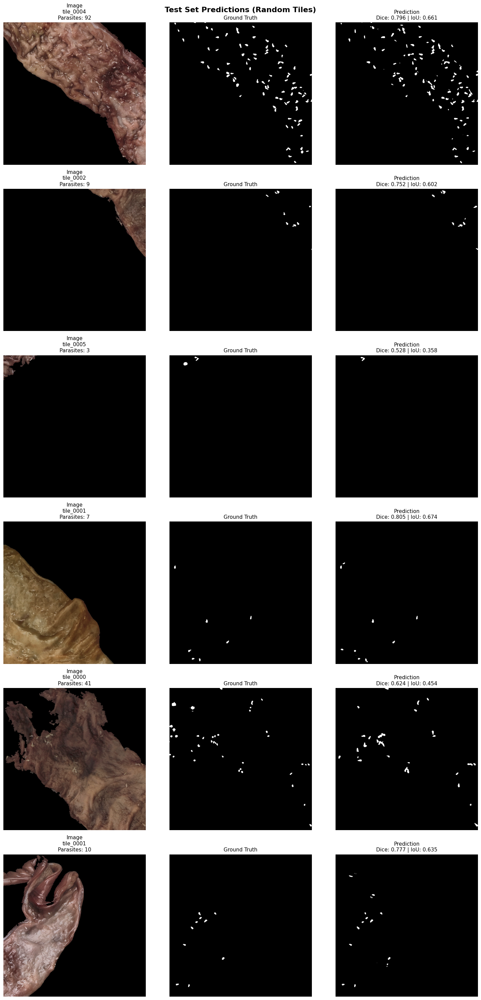

In [ ]:
# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/32_aug_pos/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device)

print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"Best Validation Dice: {checkpoint['best_dice']:.4f}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    device=device,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight']
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
eval_fine_tuner.sam.eval()

test_results = evaluate_on_test(
    fine_tuner=eval_fine_tuner,
    test_dataset=test_dataset,
    batch_size=4,
    visualize=True,         # Show some example predictions
    num_viz_samples=6       # Number of tiles to visualize
)

FULL IMAGE RECONSTRUCTION WITH VISUALIZATION
Testing on 6 images: ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']

Processing: B2025-00231b...
  Reconstructing: 4096 x 2805 (~131.5MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.7638 | IoU: 0.6179 | Precision: 0.7550 | Recall: 0.7729

Processing: B2025-00143b...
  Reconstructing: 3707 x 3687 (~156.4MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.7504 | IoU: 0.6005 | Precision: 0.7743 | Recall: 0.7280

Processing: B2025-00206b...
  Reconstructing: 3660 x 3072 (~128.7MB, 6 tiles)
  Successfully processed 6/6 tiles
  Dice: 0.8157 | IoU: 0.6887 | Precision: 0.7830 | Recall: 0.8512

Processing: B2025-00136b...
  Reconstructing: 4025 x 3433 (~158.1MB, 7 tiles)
  Successfully processed 7/7 tiles
  Dice: 0.8229 | IoU: 0.6991 | Precision: 0.8402 | Recall: 0.8063

Processing: B2025-00085.2...
  Reconstructing: 3207 x 3581 (~131.4MB, 9 tiles)
  Successfully processed 9/9 tiles
 

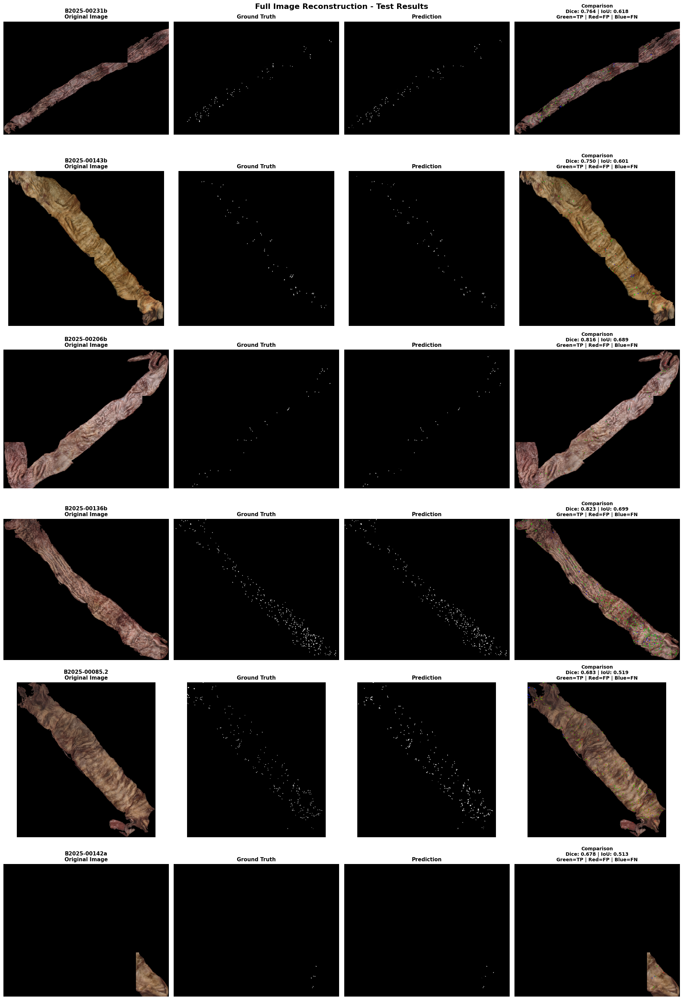

In [ ]:
results_df, visualizations = evaluate_full_images(
    fine_tuner=eval_fine_tuner,
    splits=splits,
    test_dataset=test_dataset,
    max_image_size_mb=300,                  # Skip images larger than 300MB
    process_in_chunks=True,                 # Process tiles in chunks
    chunk_size=30,                          # Clear cache every 30 tiles
)